# etf_technical_2020.05.19 (stat factors)
---

## Version Info

### Accompanied by:
* `etf_data_apr2020.py`
* `etf_technical_20200517.py`

### Git Hashes
* madmax   `07f7d8e` ... `efff1e0`
* research `a2bedcc` ... c372925

## Notes:
* Computed statistical factors using
    + random initialization  in minibatches
    + iteratively added new statfacs - maintaining orthogonality to previous statfacs
    + different kappas and window lenghts
* Established baselines for the model withotu statfacs
* Ran some basic regressions with statfacs (not residualization)
* Moving on a version where statfacs are initialized with value from previous minibatch

---
## History

##### `http://localhost:18888/notebooks/research/etf_technical/etf_technical_2020.05.17%20(features%2Bprofiling).ipynb`. 
* adding ta-lib like features for 500 ETFs. Feature profiled, online learning model

##### `etf_technical_2020.05.13`
* I had gotten omega weighting done (seems to add a little bit but not much)


In [1]:
# preamble
%alias_magic  nbagg matplotlib -p nbagg
%alias_magic  inline matplotlib -p inline
%load_ext memory_profiler

from pylab import *
from madmax.api import *
mx = mx.reload()
mxtr = mxtr.reload()
plt.style.use('seaborn-whitegrid')

###################################################################
# Interactive configuration 
# When running a config grid this will throw a FrozenException 
# and the grid Config will be used
###################################################################
try:
    mx.Config.name = 'etf_technical/technical/2020.05.19'
    mx.Config.mode = 'interactive'
    mx.Config.hps = mx.HPSet()
    mx.Config.code = 'etf_technical_2020.05.19 (stat factors).ipynb'
    disp( 'Running interactive configuration ', h=2 )        
except mx.Config.FrozenException:
    if mx.Config.mode != 'grid':
        raise RuntimeError( 'An unexpected configruation encountered' )
    disp( 'Running a grid configuration ', h=2 )

device = 'cuda'
dtype = tr.float32
hps = mx.HPSet(
    start = '20070101',    
    end='20200501',
    INTS_PER_DAY = 13,
)

mx.Config.start()


# to run run a grid of hyperparameters ...
####################################

# # hyperparameters
# mx.Config.hps = fr.HPSet( 
  
# )
# mx.Config.code = ''

# # configs = []
# # for obs_weight in ['no_weight', 'dollar_weight', 'log_weight']:
# #     cfg = fr.Config.clone()
# #     cf
# #     cfg.hps = cfg.hps.clone( obs_weight=obs_weight )
# #     cfg.freeze()
# #     display_html( cfg )
# #     configs.append( cfg )
# # notebook = fr.Config.run_grid( configs, outfile=fr.Config.uri+'/../cadre_price_index.20200302 - weight_grid_results.ipynb', n_jobs=None )



Created `%nbagg` as an alias for `%matplotlib nbagg`.
Created `%inline` as an alias for `%matplotlib inline`.


<IPython.core.display.Javascript object>

<h1> Config etf_technical/technical/2020.05.19 </h1>
<b> hash</b>: none </h4>
<b> mode </b>: interactive
<b> frozen </b>: False
<b> uri </b>: /home/fj/experiments/etf_technical/technical/2020.05.19/none
<h3> Hyperparameters </h3>
HPSet(
	)<h3> Code </h3>
<b> format </b>: .ipynb
<b> code </b> : /local/cloud/code/research/etf_technical/etf_technical_2020.05.19 (stat factors).ipynb

<IPython.core.display.Javascript object>


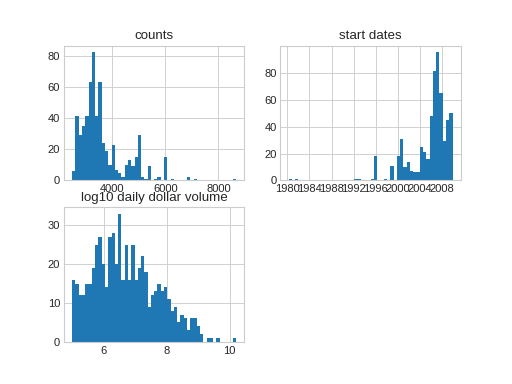

In [2]:
# identify the universe of ETFS
#############################################################
%nbagg
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )

hps.universe = mx.HPSet(
    start = '20100101',
    end='20200401',
    min_count=2000,
    min_dollar_vol=1e5
)
etf_stats = etfd.compute_etf_stats()
etf_stats = etf_stats[etf_stats.vendor=='kibot']
orig_len = len( etf_stats )
# drop etfs without enough history
etf_stats = etf_stats[(etf_stats['start'] <= hps.universe.start ) 
                      & (etf_stats['end'] > hps.universe.end ) 
                      & (etf_stats['n'] >= hps.universe.min_count)
                      & (etf_stats['daily_dollar_volume_adj'] >= hps.universe.min_dollar_vol ) ]

disp( 'after filtering', len( etf_stats ), 'symbols out of original ' ,orig_len )

etf_stats = (etf_stats
             .merge( etfd.all_etfs, how='left', left_on='symbol', right_on='Symbol' )
             .drop( columns=['Symbol', 'ETP Name', 'Leveraged / Inverse' ])
             .rename( columns={'Asset Class':'asset_class', 'Description':'name'} )
             .fillna( 'Not Specified')             
             .set_index('symbol')
            )
disp( etf_stats.groupby('asset_class').name.count() )

ax = subplot( 2,2, 1 )
etf_stats.n.hist(ax=ax, bins=50)
ax.set_title( 'counts')

ax = subplot( 2,2, 2 )
etf_stats.start.hist(ax=ax, bins=50)
ax.set_title( 'start dates')

ax = subplot( 2,2, 3 )
etf_stats.daily_dollar_volume_adj.log10().hist(ax=ax, bins=50)
ax.set_title( 'log10 daily dollar volume')

# this is the universe we will work with. 
# HERO has a massive returns spike in 2015.11.09 - which throws off residualization quite a bit.
hps.universe.symbols = sorted( etf_stats.index.values )


In [ ]:
# build up the data and features
#############################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )
from research.etf_technical import etf_technical_20200517 as etfrc; reload( etfrc )

# fetch the data as a dataarray
builder = etfd.BuildDataWithAfacs( symbols=hps.universe.symbols, mkt_only=True, start=hps.start ,).set( memoize=True )
builder.data = None
disp( 'builder BuildDataWithAfacs_7f79ef4bf  expected got', builder.hash() )
da = builder(  )
df = builder.output_meta

# hyperparams related to computing returns and residuals
hps.returns_hps = mx.HPSet(    
    price_windows=[ 24*1, 24*5, 24*10],
    beta_halflifes=[13 * 90, 13 * 180, 13 * 252, 13*500],
    dollar_volume_window=13*180,
    ema_halflifes=[20 * 13, 60 * 13, 252 * 13],
    resid_halflife=13,
    
)
# compute log-returns, log-dollar-volume, betas, residual returns and clean up the data
rtn_computer = etfrc.compute_returns_and_betas( 
    start=hps.start, end=None,     
    dollar_volume_window=hps.returns_hps.dollar_volume_window, 
    price_windows = hps.returns_hps.price_windows,
    beta_halflifes=hps.returns_hps.beta_halflifes, 
    resid_halflife=None,    
) 
rtn_computer.data = builder
disp( 'expected compute_returns_and_betas_9280a30dd got', rtn_computer.hash(), h=4, color='teal' )

# add relative price and relative volume features
rel_price_and_vols = etfrc.add_relative_price_and_volumes( emas=hps.returns_hps.ema_halflifes )
rel_price_and_vols.data = rtn_computer
disp( 'expected add_relative_price_and_volumes_63410a484 got', rel_price_and_vols.hash(), h=4, color='teal' )

# add volatility and calendar features
add_vols = etfrc.add_volatilities( emas=hps.returns_hps.ema_halflifes )
add_vols.data = rel_price_and_vols
disp( 'expected add_volatilities_4c3deb6da got', add_vols.hash(), h=4, color='teal' )

da = add_vols(  )

In [3]:
# the features built up to now
############################################

hps.feature_set = mx.HPSet(
    unadj_prices=[
        'open_unadj_30min', 'high_unadj_30min', 'low_unadj_30min', 'close_unadj_30min', 'mid_unadj_30min',
        'log_open_unadj_30min', 'log_close_unadj_30min',
    ],
    adj_prices=[
        'open_adj_30min', 'high_adj_30min', 'low_adj_30min', 'close_adj_30min',
        'mid_adj_30min', 'mid_adj_0D.12h.vwap', 'mid_adj_2D.12h.vwap', 'mid_adj_5D.vwap',
        'open_adj_0D.12h', 'high_adj_0D.12h', 'low_adj_0D.12h',
        'open_adj_2D.12h', 'high_adj_2D.12h', 'low_adj_2D.12h',
        'open_adj_5D', 'high_adj_5D', 'low_adj_5D',
    ],
    rel_prices=[
        'rel_price_260', 'rel_price_780', 'rel_price_3276',
    ],
    volumes=[
        'volume_unadj_30min', 'dollar_volume_unadj_30min', 'avg_dollar_volume',
    ],
    log_volumes=[
        'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid',
    ],
    rel_volume=[
        'rel_dollar_volume_260', 'rel_dollar_volume_780',
        'rel_dollar_volume_3276',
    ],
    calendar=[
        'timeofday', 'cos1_timeofday', 'cos2_timeofday', 'cos4_timeofday',
        'dayofweek', 'cos1_dayofweek', 'cos2_dayofweek',
        'weekofmonth', 'cos1_weekofmonth', 'cos2_weekofmonth',
        'monthofquarter', 'cos1_monthofquarter', 'cos2_monthofquarter',
        'quarterofyear', 'cos1_quarterofyear', 'cos2_quarterofyear',
    ],
    lagging=[
        'lagrtn_adj_30min', 'lagrtn_adj_1hr', 'lagrtn_adj_1day',
        'lagrtn_adj_30min_resid',
    ],
    mkt=[
        'mkt_lagrtn_30min',
        'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',
    ],
    vol=[
        'lagrtn_adj_30min_260.rw_sd', 'lagrtn_adj_30min_780.rw_sd', 'lagrtn_adj_30min_3276.rw_sd',
        'lagrtn_adj_30min_resid_260.rw_sd', 'lagrtn_adj_30min_resid_780.rw_sd', 'lagrtn_adj_30min_resid_3276.rw_sd',
    ],
    zscores=[
        'lagrtn_adj_30min_260.rw_zscore', 'lagrtn_adj_30min_780.rw_zscore', 'lagrtn_adj_30min_3276.rw_zscore',
        'lagrtn_adj_30min_resid_260.rw_zscore', 'lagrtn_adj_30min_resid_780.rw_zscore',
        'lagrtn_adj_30min_resid_3276.rw_zscore',
    ],
    betas=[
        'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min_2340.ew_beta',
        'lagrtn_adj_30min_3276.ew_beta', 'lagrtn_adj_30min_6500.ew_beta',
    ],
    afacs=[ 'bw_afac_30min', 'fw_afac_30min' ],
    technical=[
        'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
        'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
        'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
        'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
        'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
    ],    
)
hps.leading_rtns = [
    'leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day',
    'mkt_leadrtn_30min', 'mkt_leadrtn_1day',
]
hps.weights = ['valid_30min', 'weight', ]

In [5]:
##### Profile the various sub-feature sets computed (don't run this too often )
##############################################################################
%inline
@mx.operatorize( memoize=True, produces_features=False )
def FeatureCorrelations( data, features, start, frac=0.5 ):
    '''computer feature set correlations'''
    data = data.loc[start:, :, features]
    if frac:
        ix = pd.Series( range( len( data ) ) ).sample( frac=frac, random_state=1 )
        data = data[ix.values]
    return data.corr_mx()

def process_one_feature_set( data, fs_features=None, leading=hps.leading_rtns ):
    '''profile one feature set '''
    with mx.timer( 'computing feautre coorelations' ):
        fc = FeatureCorrelations( start='20150101' )
        fc.data = data
        fc.features = fs_features + leading
        corr_df = fc()
    with mx.timer( 'running profile' ):
        #  -- profile the features
        profiler = mx.FeatureProfiler(
            returns=['leadrtn_adj_30min', 'leadrtn_adj_1day',],
            exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'mkt_lagrtn_30min'],
            transforms=None, weight='weight', winsorize=0.05, xs=None, start='20150101',
            lags=[1, 3, 5], autocorr=[1, 2, 13]
        ).set( verbose=False, memoize=True )
        profiler.data = data
        profiler.features = fs_features
        profiler.run()
    return corr_df, profiler

# for fs in ['statfac', 'technical', 'afacs', 'betas' ]: #+ list( hps.feature_set.keys() ):    
#     fs_features = getattr( hps.feature_set, fs )
#     disp( 'processing ', fs_features, h=2 )
#     corr_df, profiler = process_one_feature_set( fs_features=fs_features ) 
#     mx.disp( corr_df.loc[fs_features], corr=True )    
#     profiler.display()     

/home/fj/cloud/code/madmax/experiment/hpset.py:17: UserWarning: converting dict tv={1: 1, 2: 0.1, 13: 0.001}  to OrderedDict - use HPSet instead 
  warnings.warn( f'converting dict {k}={v}  to OrderedDict - use HPSet instead ' )


,num_calls,duration_total,duration_mean,duration_squared,duration_std
StatFacs.diagnostics,1,8.089070,4.044535,3.271652e+01,4.044535
StatFacs.forward,1,406.673153,203.336576,8.269153e+04,203.336576
_log_mb_to_tensorboard,17,108.526115,6.029229,3.962176e+01,1.808358
inner_optimization,17,297.993004,16.555167,2.999598e+02,5.087848
loss.backward,954,185.100217,0.193822,3.849185e-02,0.030411
mb_setup,17,0.013564,0.000754,6.287631e-07,0.000247
mb_statistics,17,0.019122,0.001062,1.212502e-06,0.000290
opt.step,954,0.578648,0.000606,4.099250e-07,0.000207
self._loss,954,109.238158,0.114386,1.364804e-02,0.023749


,num_calls,duration_total,duration_mean,duration_squared,duration_std
StatFacs.diagnostics,1,8.039253,4.019626,3.231479e+01,4.019626
StatFacs.forward,1,992.907620,496.453810,4.929328e+05,496.453810
_log_mb_to_tensorboard,17,128.860937,7.158941,5.563391e+01,2.093674
inner_optimization,17,863.905025,47.994724,2.506621e+03,14.252294
loss.backward,1700,572.593597,0.336622,1.167698e-01,0.058784
mb_setup,17,0.014250,0.000792,7.182176e-07,0.000302
mb_statistics,17,0.019081,0.001060,1.241303e-06,0.000343
opt.step,1700,1.076954,0.000633,4.473006e-07,0.000216
self._loss,1700,284.594968,0.167310,2.871706e-02,0.026913


,num_calls,duration_total,duration_mean,duration_squared,duration_std
StatFacs.diagnostics,1,8.079345,4.039673,3.263791e+01,4.039673
StatFacs.forward,1,415.829494,207.914747,8.645708e+04,207.914747
_log_mb_to_tensorboard,17,153.564335,8.531352,7.909549e+01,2.512275
inner_optimization,17,262.132354,14.562909,2.300506e+02,4.239380
loss.backward,839,163.197488,0.194283,3.870884e-02,0.031033
mb_setup,17,0.013998,0.000778,6.800796e-07,0.000275
mb_statistics,17,0.019608,0.001089,1.281568e-06,0.000308
opt.step,839,0.493083,0.000587,3.848771e-07,0.000201
self._loss,839,95.735023,0.113970,1.332380e-02,0.018291


,num_calls,duration_total,duration_mean,duration_squared,duration_std
StatFacs.diagnostics,1,8.009897,4.004948,3.207922e+01,4.004948
StatFacs.forward,1,764.050138,382.025069,2.918863e+05,382.025069
_log_mb_to_tensorboard,17,172.556524,9.586474,9.980272e+01,2.811093
inner_optimization,17,591.321710,32.851206,1.177602e+03,9.919705
loss.backward,1166,390.691295,0.334783,1.154009e-01,0.057632
mb_setup,17,0.012920,0.000718,5.743490e-07,0.000243
mb_statistics,17,0.019294,0.001072,1.272389e-06,0.000351
opt.step,1166,0.739050,0.000633,4.363259e-07,0.000188
self._loss,1166,196.060605,0.168004,2.893998e-02,0.026733


,num_calls,duration_total,duration_mean,duration_squared,duration_std
StatFacs.diagnostics,1,7.844094,3.922047,3.076490e+01,3.922047
StatFacs.forward,1,452.291501,226.145750,1.022838e+05,226.145750
_log_mb_to_tensorboard,17,194.708150,10.817119,1.271416e+02,3.183007
inner_optimization,17,257.383754,14.299097,2.222795e+02,4.220820
loss.backward,821,159.980284,0.194623,3.889169e-02,0.031835
mb_setup,17,0.014525,0.000807,7.606836e-07,0.000331
mb_statistics,17,0.018778,0.001043,1.175962e-06,0.000296
opt.step,821,0.506532,0.000616,4.222246e-07,0.000206
self._loss,821,94.184252,0.114579,1.348178e-02,0.018798


,num_calls,duration_total,duration_mean,duration_squared,duration_std
StatFacs.diagnostics,1,7.817600,3.908800,3.055743e+01,3.908800
StatFacs.forward,1,759.823471,379.911735,2.886659e+05,379.911735
_log_mb_to_tensorboard,17,218.192465,12.121804,1.596744e+02,3.568797
inner_optimization,17,541.421007,30.078945,9.853163e+02,8.976266
loss.backward,1064,358.474189,0.336595,1.166829e-01,0.058193
mb_setup,17,0.013803,0.000767,6.514310e-07,0.000252
mb_statistics,17,0.018742,0.001041,1.195015e-06,0.000333
opt.step,1064,0.672385,0.000631,4.297859e-07,0.000177
self._loss,1064,178.846182,0.167931,2.892863e-02,0.026980


,statfac_0_win.65_kappa.-1,statfac_1_win.65_kappa.-1,statfac_0_win.650_kappa.-1,statfac_1_win.650_kappa.-1,statfac_0_win.65_kappa.None,statfac_1_win.65_kappa.None,statfac_0_win.650_kappa.None,statfac_1_win.650_kappa.None,statfac_0_win.65_kappa.1,statfac_1_win.65_kappa.1,statfac_0_win.650_kappa.1,statfac_1_win.650_kappa.1,leadrtn_adj_30min,leadrtn_adj_1hr,leadrtn_adj_1day,mkt_leadrtn_30min,mkt_leadrtn_1day
statfac_0_win.65_kappa.-1,100.00%,0.67%,1.77%,-0.17%,-0.40%,-0.14%,1.85%,0.19%,-2.75%,0.03%,0.16%,-0.15%,-0.54%,-0.19%,-0.31%,-0.35%,0.11%
statfac_1_win.65_kappa.-1,0.67%,100.00%,0.35%,2.83%,0.31%,-0.49%,0.59%,2.96%,-0.05%,-2.76%,-0.28%,0.30%,0.68%,0.49%,-0.46%,-0.47%,0.21%
statfac_0_win.650_kappa.-1,1.77%,0.35%,100.00%,-1.28%,-2.05%,0.25%,4.68%,0.76%,-1.32%,0.16%,1.55%,-0.31%,0.37%,0.19%,2.38%,0.55%,1.45%
statfac_1_win.650_kappa.-1,-0.17%,2.83%,-1.28%,100.00%,-0.06%,-2.05%,0.85%,4.32%,0.01%,-1.40%,-0.18%,0.38%,-0.79%,-0.78%,-0.54%,-2.04%,0.19%
statfac_0_win.65_kappa.None,-0.40%,0.31%,-2.05%,-0.06%,100.00%,0.59%,-0.30%,-0.09%,-3.22%,-0.00%,-0.71%,0.08%,-0.17%,0.05%,0.18%,-0.44%,0.16%
statfac_1_win.65_kappa.None,-0.14%,-0.49%,0.25%,-2.05%,0.59%,100.00%,-0.14%,-0.27%,0.19%,-3.63%,-0.13%,-0.74%,-0.17%,-0.09%,-0.07%,-0.52%,-0.39%
statfac_0_win.650_kappa.None,1.85%,0.59%,4.68%,0.85%,-0.30%,-0.14%,100.00%,-0.15%,-0.43%,0.05%,2.49%,0.33%,0.71%,0.09%,-0.40%,0.49%,0.02%
statfac_1_win.650_kappa.None,0.19%,2.96%,0.76%,4.32%,-0.09%,-0.27%,-0.15%,100.00%,-0.04%,-0.36%,0.46%,2.02%,-0.03%,-0.47%,0.73%,0.34%,0.42%
statfac_0_win.65_kappa.1,-2.75%,-0.05%,-1.32%,0.01%,-3.22%,0.19%,-0.43%,-0.04%,100.00%,0.26%,-0.52%,-0.01%,-0.04%,-0.10%,-0.08%,-0.07%,-0.22%
statfac_1_win.65_kappa.1,0.03%,-2.76%,0.16%,-1.40%,-0.00%,-3.63%,0.05%,-0.36%,0.26%,100.00%,0.20%,-0.52%,-0.00%,-0.08%,0.07%,-0.05%,-0.07%


,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-0.837793,0.802249,0.000048,0.000019,0.028537,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,-0.093784,-0.353991,-0.004548,2.068281e-05,-5.895233,-1.366798,0.115931,0.003843,0.006683
leadrtn_adj_1day,NaN,1931696,0.996036,-0.093784,0.421677,-0.001245,1.549721e-06,-1.705323,-0.404720,0.115931,0.003843,0.006683
leadrtn_adj_30min,1.0,1931696,0.995848,-0.089953,0.213099,-0.001092,1.192093e-06,-1.280673,-0.263939,0.115864,0.004028,0.006738
leadrtn_adj_1day,1.0,1931696,0.995730,-0.089953,0.488996,0.000488,2.384186e-07,0.098382,0.023894,0.115864,0.004028,0.006738
leadrtn_adj_30min,3.0,1931696,0.995237,-0.088986,0.041717,-0.001337,1.788139e-06,-1.632539,-0.329296,0.116115,0.003874,0.006866
leadrtn_adj_1day,3.0,1931696,0.995119,-0.088986,0.304863,-0.000732,5.364418e-07,-0.564766,-0.131141,0.116115,0.003874,0.006866
leadrtn_adj_30min,5.0,1931696,0.994626,-0.084524,0.099747,0.000345,-1.192093e-07,0.060804,0.014537,0.115822,0.003731,0.006612
leadrtn_adj_1day,5.0,1931696,0.994508,-0.084524,0.434933,0.001582,2.503395e-06,2.008864,0.526684,0.115822,0.003731,0.006612


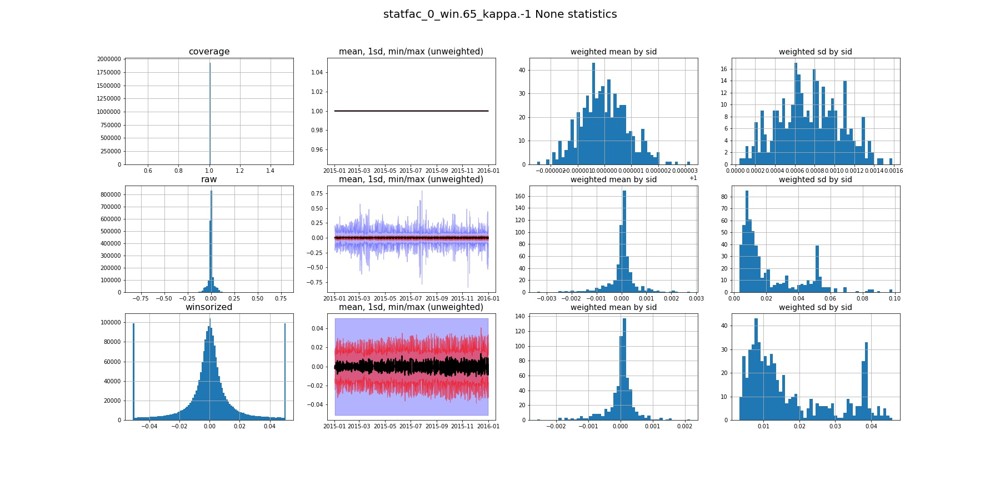

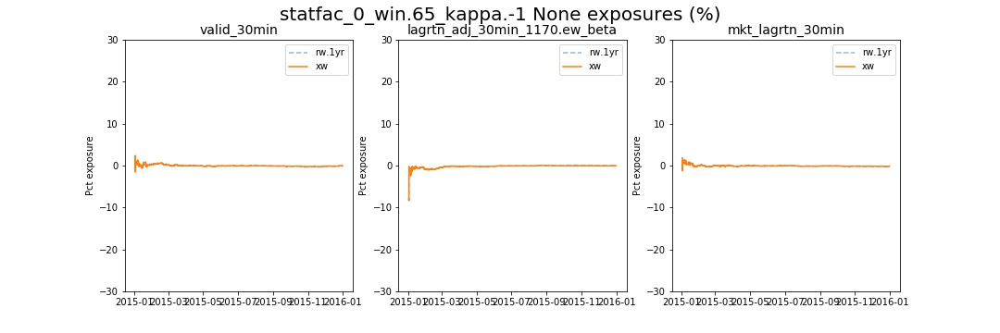

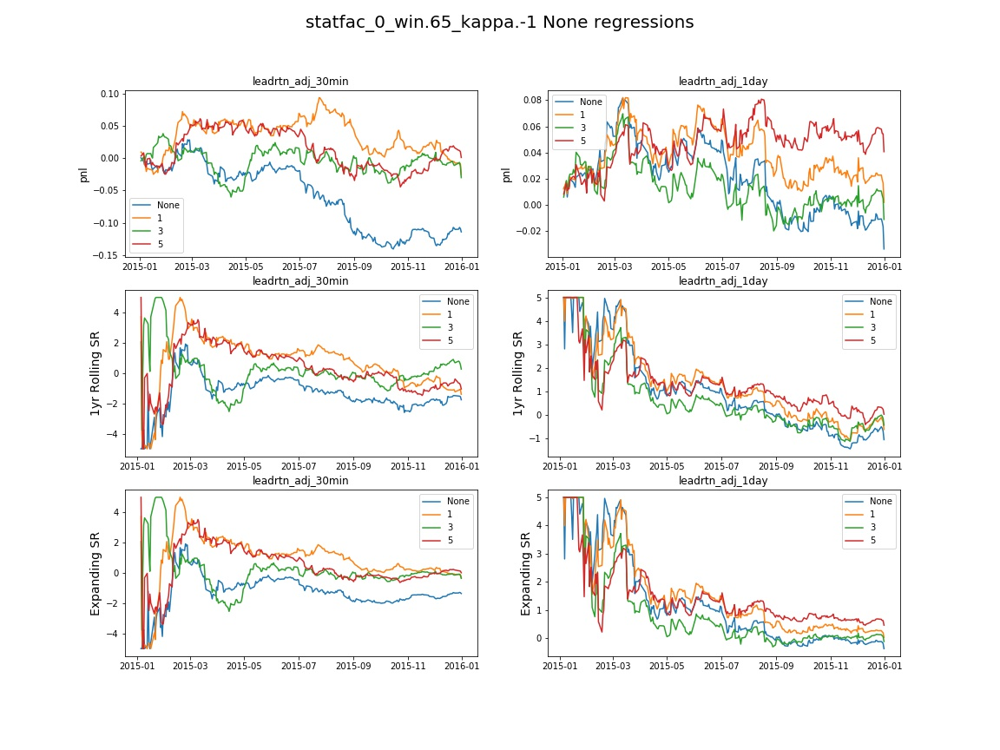

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-0.737609,0.788032,-0.000004,0.000072,0.028558,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,0.180538,-0.260347,0.002264,5.125999e-06,2.940830,0.673859,0.115977,0.028438,-0.011136
leadrtn_adj_1day,NaN,1931696,0.996036,0.180538,-0.060800,-0.000488,2.384186e-07,-0.537078,-0.122067,0.115977,0.028438,-0.011136
leadrtn_adj_30min,1.0,1931696,0.995848,0.178825,-0.332042,-0.001601,2.563000e-06,-1.945863,-0.460433,0.116014,0.028461,-0.010967
leadrtn_adj_1day,1.0,1931696,0.995730,0.178825,0.096734,-0.000810,6.556511e-07,-0.703843,-0.158830,0.116014,0.028461,-0.010967
leadrtn_adj_30min,3.0,1931696,0.995237,0.179969,0.915002,0.005015,2.515316e-05,6.635273,1.569893,0.116226,0.028446,-0.010965
leadrtn_adj_1day,3.0,1931696,0.995119,0.179969,0.324911,0.001381,1.907349e-06,1.686745,0.377418,0.116226,0.028446,-0.010965
leadrtn_adj_30min,5.0,1931696,0.994626,0.177634,-0.198113,-0.002899,8.404255e-06,-3.762717,-0.920154,0.116113,0.028188,-0.011029
leadrtn_adj_1day,5.0,1931696,0.994508,0.177634,0.003186,0.000345,1.192093e-07,0.159893,0.035362,0.116113,0.028188,-0.011029


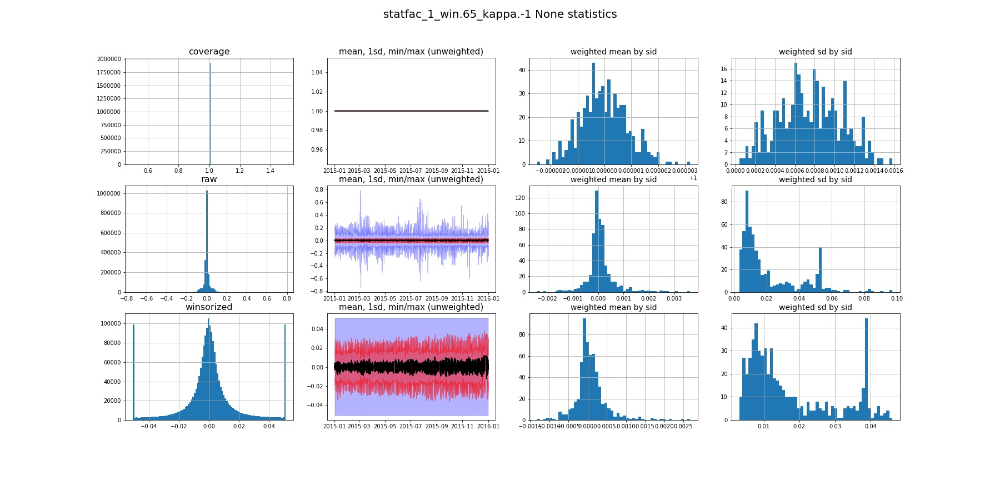

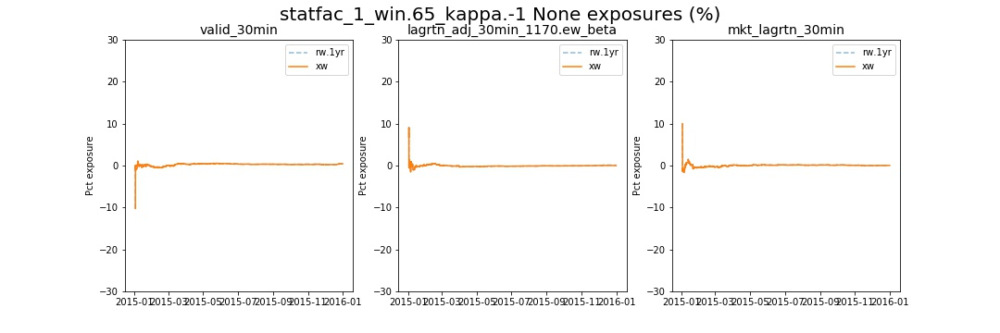

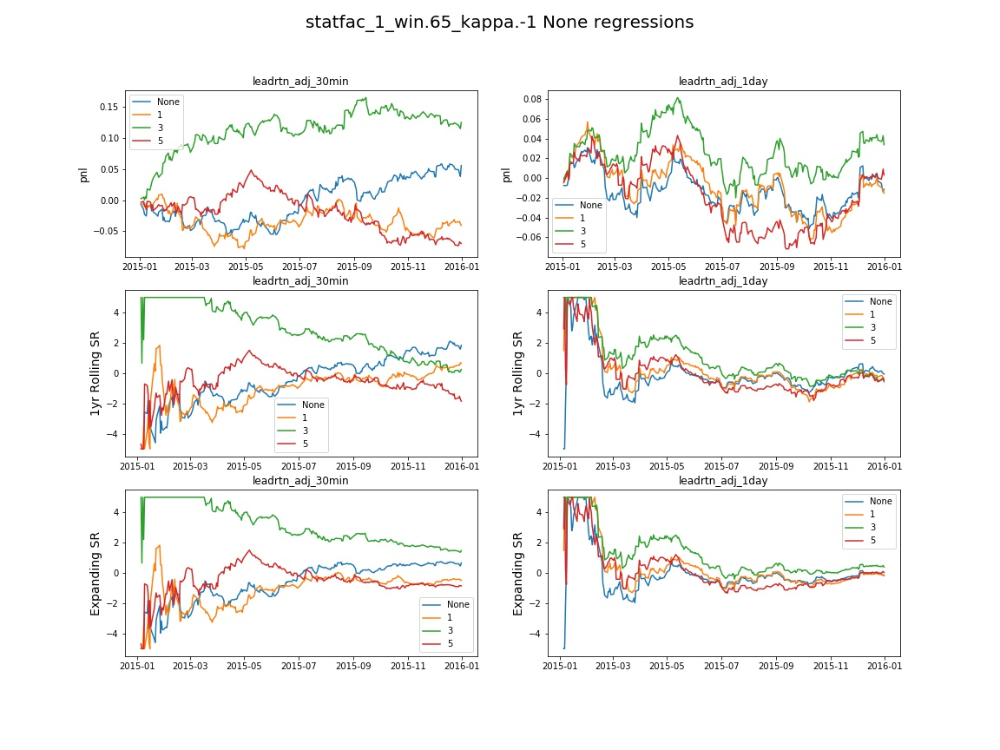

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-0.314026,0.290935,-0.000029,-0.000096,0.025238,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,-0.327585,0.073533,0.000646,4.172325e-07,0.747311,0.047356,0.018482,-0.007773,-0.004739
leadrtn_adj_1day,NaN,1931696,0.996036,-0.327585,0.758791,0.025023,6.261468e-04,34.713226,2.331457,0.018482,-0.007773,-0.004739
leadrtn_adj_30min,1.0,1931696,0.995848,-0.340113,0.269064,0.003513,1.233816e-05,4.738389,0.296194,0.018852,-0.008134,-0.004382
leadrtn_adj_1day,1.0,1931696,0.995730,-0.340113,0.484620,0.025870,6.692410e-04,35.879494,2.498884,0.018852,-0.008134,-0.004382
leadrtn_adj_30min,3.0,1931696,0.995237,-0.340274,-0.807770,-0.006832,4.667044e-05,-9.295070,-0.549046,0.019567,-0.008127,-0.004364
leadrtn_adj_1day,3.0,1931696,0.995119,-0.340274,0.080529,0.019881,3.952384e-04,27.550190,1.826905,0.019567,-0.008127,-0.004364
leadrtn_adj_30min,5.0,1931696,0.994626,-0.316511,0.450983,0.012477,1.556873e-04,17.033087,1.061588,0.018899,-0.008109,-0.003663
leadrtn_adj_1day,5.0,1931696,0.994508,-0.316511,0.548285,0.022379,5.007982e-04,31.015980,1.966752,0.018899,-0.008109,-0.003663


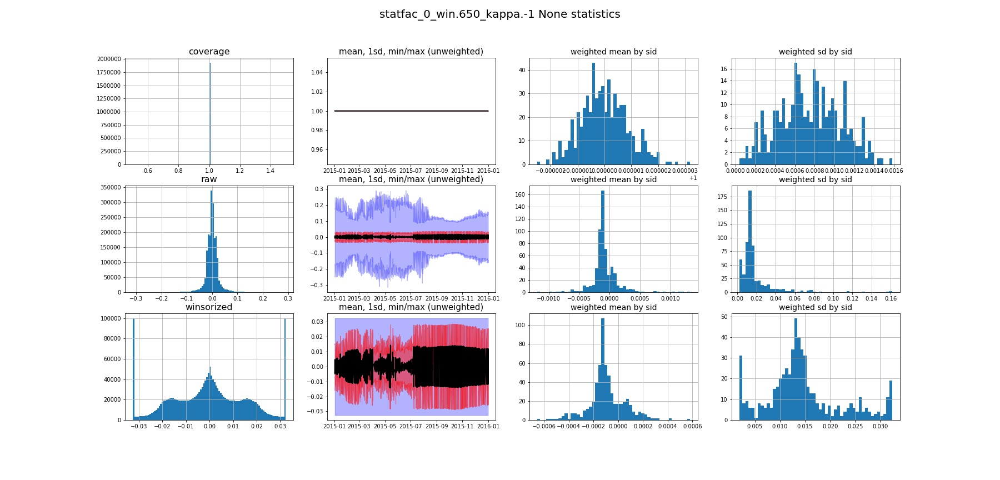

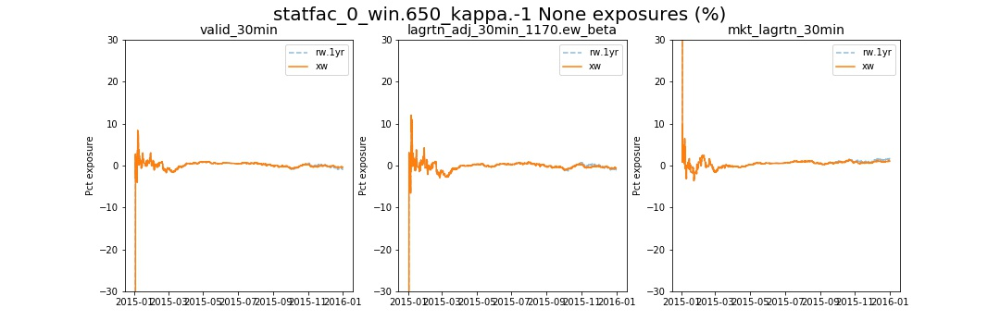

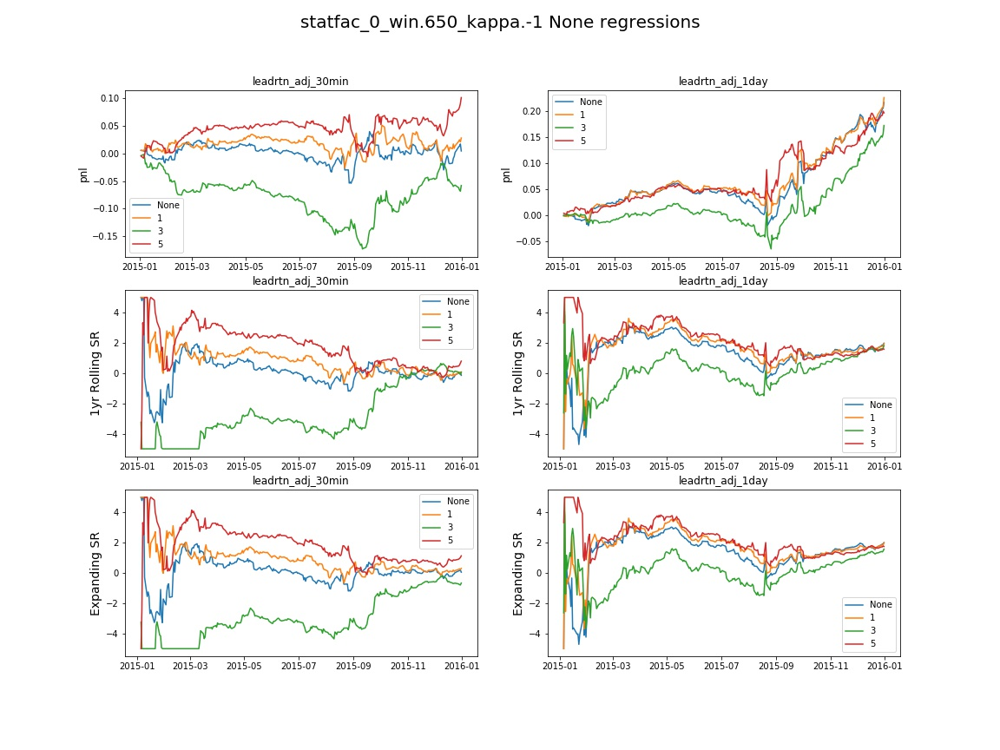

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-0.304895,0.280007,0.000022,0.000048,0.025243,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,0.148274,-0.244725,-0.012427,0.000154,-16.971996,-1.061053,0.036699,0.043549,0.005821
leadrtn_adj_1day,NaN,1931696,0.996036,0.148274,-0.580815,0.003766,0.000014,5.206938,0.224499,0.036699,0.043549,0.005821
leadrtn_adj_30min,1.0,1931696,0.995848,0.136431,-0.365125,0.001891,0.000004,2.510137,0.147457,0.037048,0.043234,0.006161
leadrtn_adj_1day,1.0,1931696,0.995730,0.136431,-0.456802,0.008687,0.000075,12.024877,0.535907,0.037048,0.043234,0.006161
leadrtn_adj_30min,3.0,1931696,0.995237,0.136567,0.150425,0.018117,0.000328,24.871294,1.739520,0.037745,0.042580,0.006166
leadrtn_adj_1day,3.0,1931696,0.995119,0.136567,-0.105326,0.015125,0.000229,20.957720,1.091047,0.037745,0.042580,0.006166
leadrtn_adj_30min,5.0,1931696,0.994626,0.136326,-0.079501,-0.003605,0.000013,-4.907288,-0.326525,0.038508,0.041922,0.006881
leadrtn_adj_1day,5.0,1931696,0.994508,0.136326,-0.150582,0.015018,0.000226,20.798773,1.238021,0.038508,0.041922,0.006881


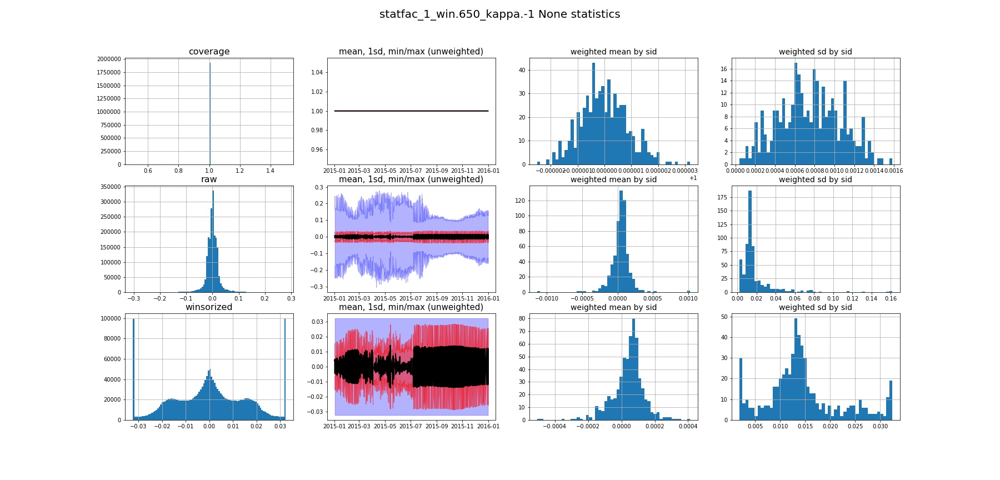

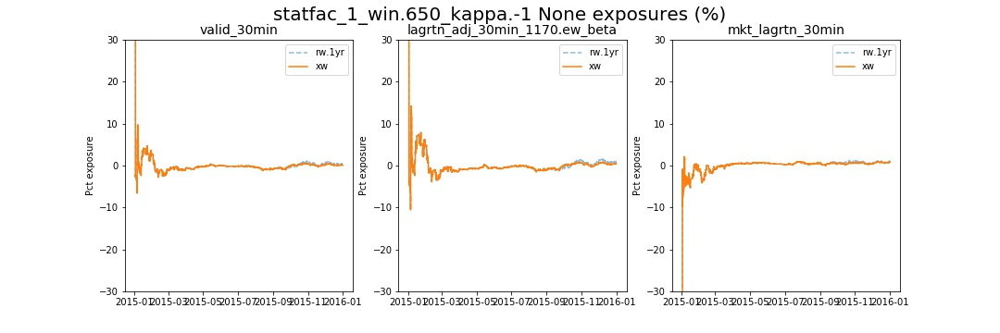

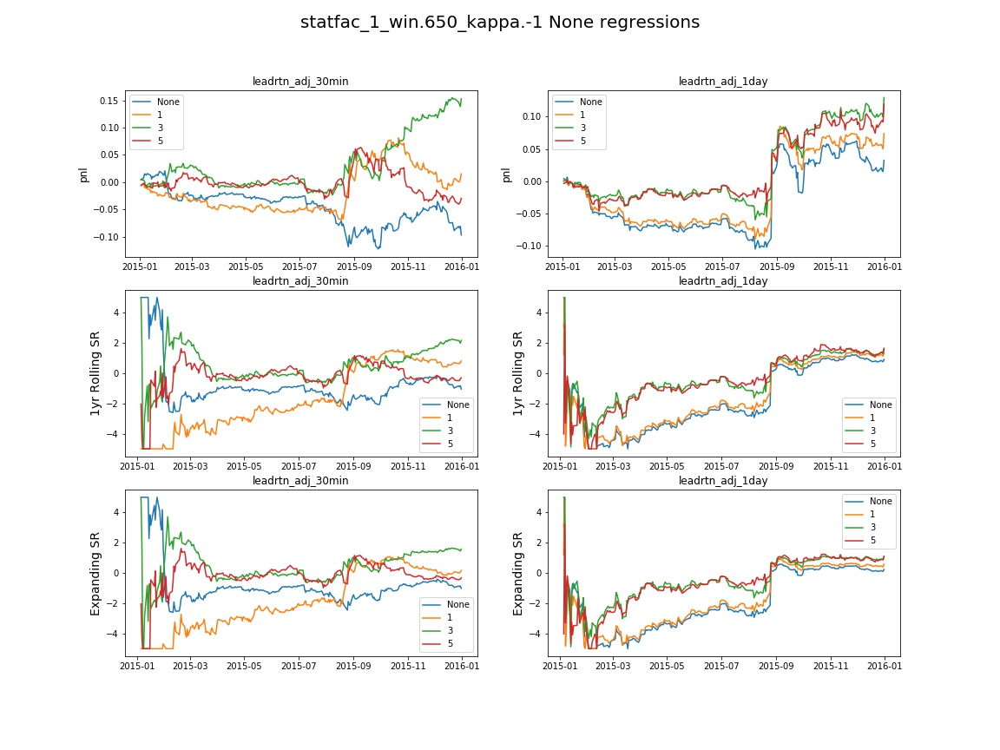

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-0.692803,0.876835,0.000065,0.000116,0.035093,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,0.172601,0.770334,0.000646,4.172325e-07,0.654518,0.390046,0.072226,0.005377,0.001323
leadrtn_adj_1day,NaN,1931696,0.996036,0.172601,0.661520,0.001171,1.370907e-06,1.296565,0.996620,0.072226,0.005377,0.001323
leadrtn_adj_30min,1.0,1931696,0.995848,0.175965,0.212073,-0.000846,7.152557e-07,-0.887275,-0.581015,0.072262,0.005443,0.001405
leadrtn_adj_1day,1.0,1931696,0.995730,0.175965,0.546840,0.001007,1.013279e-06,1.312495,0.982513,0.072262,0.005443,0.001405
leadrtn_adj_30min,3.0,1931696,0.995237,0.173443,0.439379,-0.000000,0.000000e+00,-0.001806,-0.001292,0.072293,0.005359,0.001544
leadrtn_adj_1day,3.0,1931696,0.995119,0.173443,0.419572,0.001337,1.788139e-06,1.671113,1.088520,0.072293,0.005359,0.001544
leadrtn_adj_30min,5.0,1931696,0.994626,0.170018,-0.369872,-0.001485,2.205372e-06,-1.848728,-1.055330,0.072376,0.005386,0.001607
leadrtn_adj_1day,5.0,1931696,0.994508,0.170018,0.477062,0.002156,4.649162e-06,2.763788,1.686498,0.072376,0.005386,0.001607


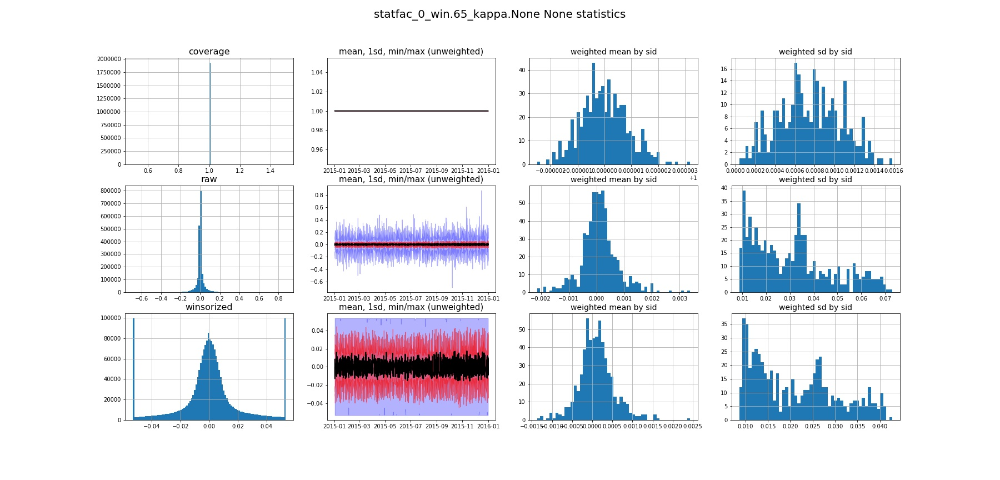

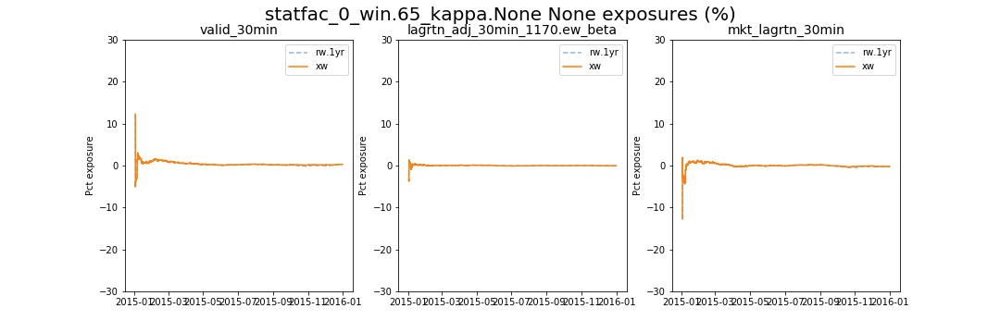

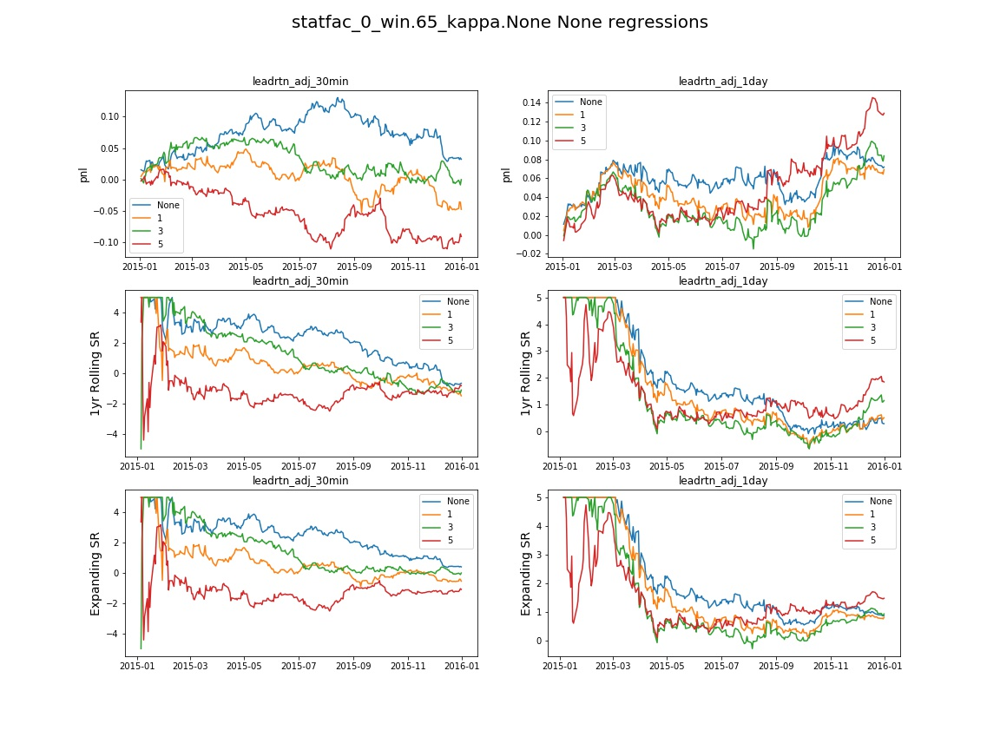

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-0.733914,0.667673,0.000045,0.000138,0.035155,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,0.195186,0.152487,0.001221,1.490116e-06,1.457396,0.884047,0.069921,0.016056,-0.000626
leadrtn_adj_1day,NaN,1931696,0.996036,0.195186,-0.039467,-0.000598,3.576279e-07,-0.282736,-0.172654,0.069921,0.016056,-0.000626
leadrtn_adj_30min,1.0,1931696,0.995848,0.194253,0.295520,0.000691,4.768372e-07,0.847700,0.528699,0.069887,0.016104,-0.000675
leadrtn_adj_1day,1.0,1931696,0.995730,0.194253,-0.116635,-0.000946,8.940697e-07,-0.929211,-0.613733,0.069887,0.016104,-0.000675
leadrtn_adj_30min,3.0,1931696,0.995237,0.194319,-0.066724,0.001827,3.337860e-06,2.324286,1.283288,0.069986,0.016051,-0.000697
leadrtn_adj_1day,3.0,1931696,0.995119,0.194319,-0.307523,-0.001465,2.145767e-06,-1.986270,-1.412380,0.069986,0.016051,-0.000697
leadrtn_adj_30min,5.0,1931696,0.994626,0.194793,-0.106898,-0.000691,4.768372e-07,-0.717274,-0.441758,0.070173,0.015910,-0.000695
leadrtn_adj_1day,5.0,1931696,0.994508,0.194793,-0.184374,-0.001983,3.933907e-06,-2.596650,-1.854630,0.070173,0.015910,-0.000695


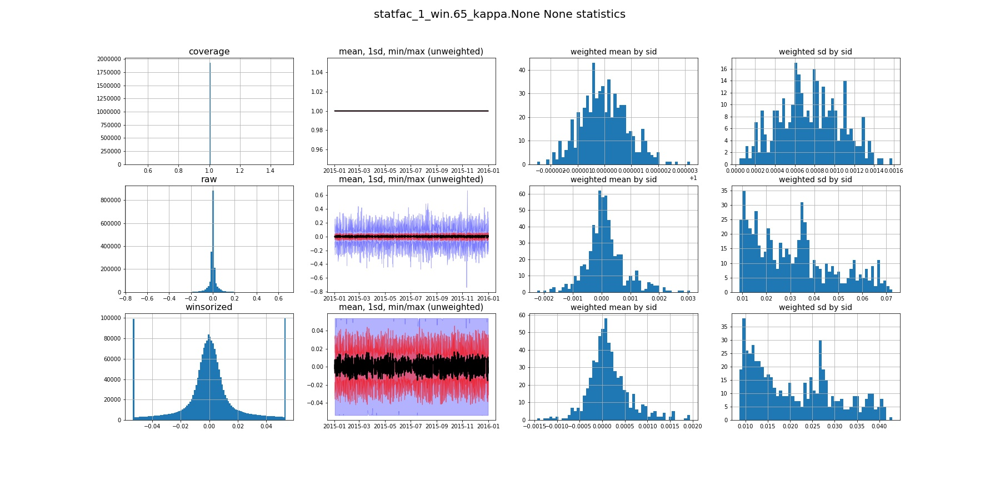

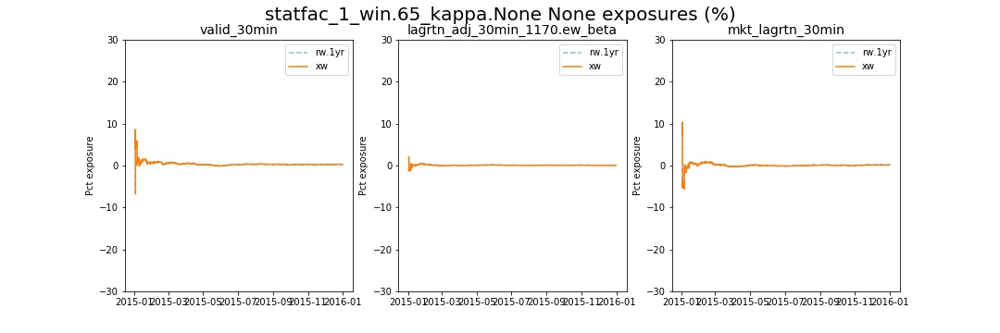

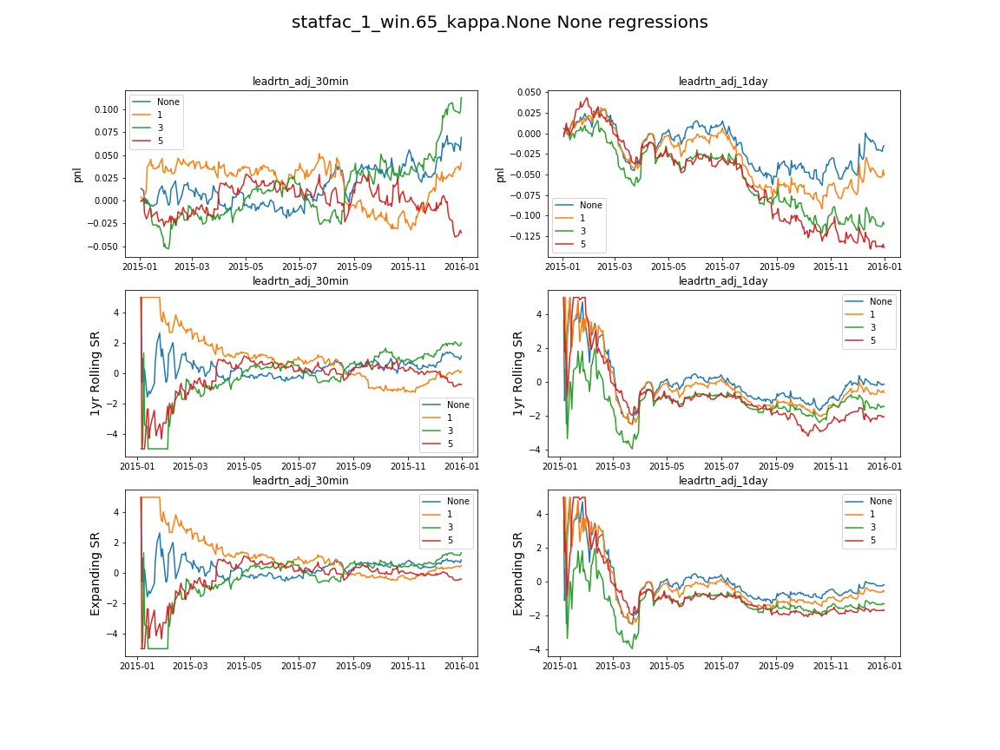

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-0.845684,0.945823,0.000003,0.000025,0.026173,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,0.091651,-0.055143,-0.002264,0.000005,-2.963191,-0.469626,0.025675,-0.006377,-0.012243
leadrtn_adj_1day,NaN,1931696,0.996036,0.091651,0.138962,-0.000000,0.000000,-0.020584,-0.002737,0.025675,-0.006377,-0.012243
leadrtn_adj_30min,1.0,1931696,0.995848,0.095006,-0.289101,-0.004535,0.000021,-6.021919,-1.055094,0.025992,-0.006076,-0.012567
leadrtn_adj_1day,1.0,1931696,0.995730,0.095006,0.176361,0.001424,0.000002,1.798801,0.238277,0.025992,-0.006076,-0.012567
leadrtn_adj_30min,3.0,1931696,0.995237,0.087843,0.423892,0.001827,0.000003,2.480030,0.334200,0.025528,-0.006417,-0.012609
leadrtn_adj_1day,3.0,1931696,0.995119,0.087843,0.222838,0.004257,0.000018,5.812504,0.854838,0.025528,-0.006417,-0.012609
leadrtn_adj_30min,5.0,1931696,0.994626,0.077314,-0.297544,-0.007051,0.000050,-9.596805,-1.427465,0.025407,-0.006342,-0.012967
leadrtn_adj_1day,5.0,1931696,0.994508,0.077314,0.229980,0.004207,0.000018,5.798849,0.805165,0.025407,-0.006342,-0.012967


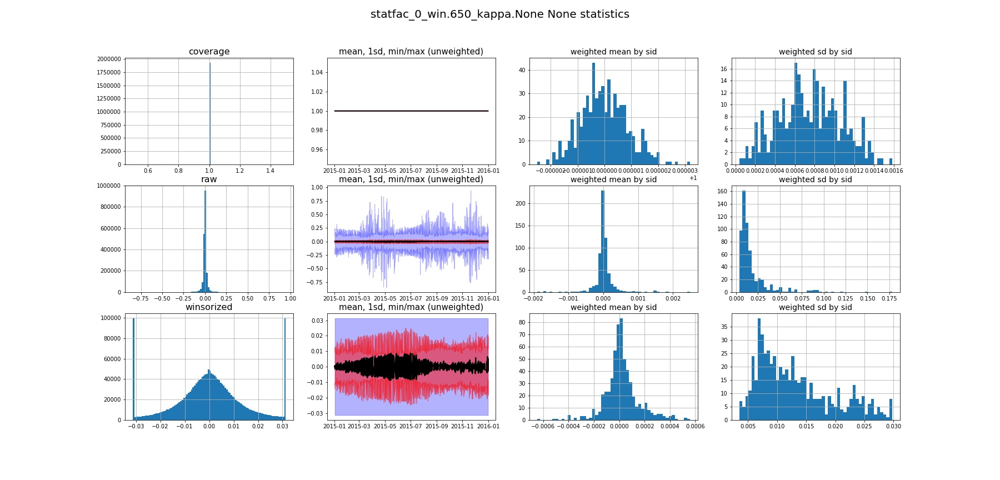

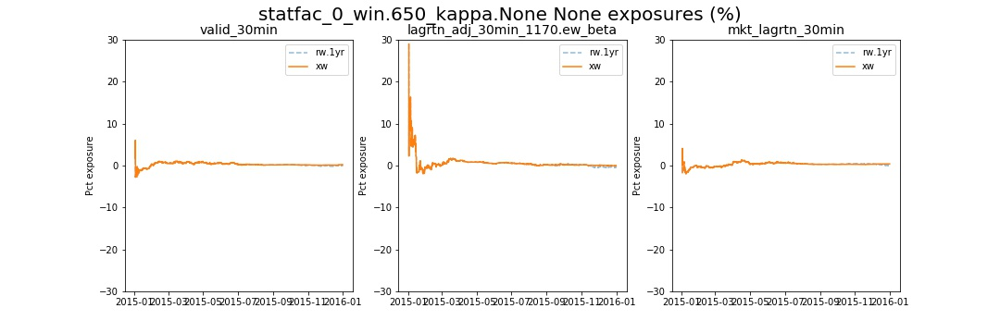

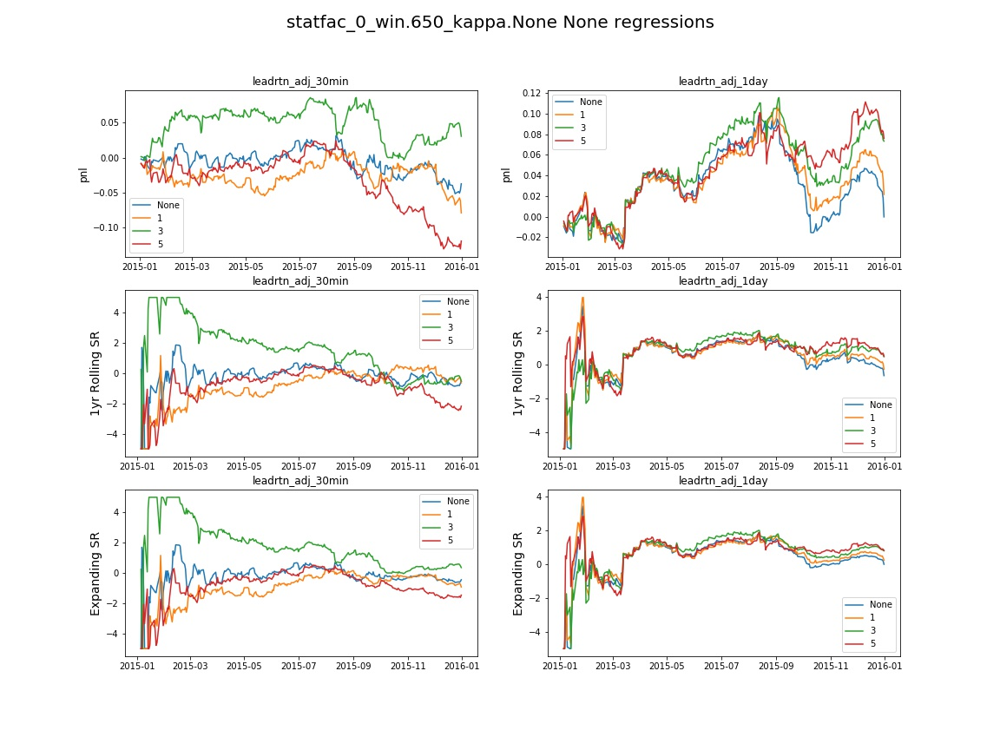

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-1.338158,1.056702,0.000083,0.000107,0.026175,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,0.529402,0.091816,0.002762,7.629395e-06,3.700021,0.541678,0.025632,0.044148,-0.001609
leadrtn_adj_1day,NaN,1931696,0.996036,0.529402,-0.070280,-0.004696,2.205372e-05,-6.458358,-0.871770,0.025632,0.044148,-0.001609
leadrtn_adj_30min,1.0,1931696,0.995848,0.534313,0.308243,-0.001827,3.337860e-06,-2.312743,-0.305577,0.025359,0.043909,-0.001339
leadrtn_adj_1day,1.0,1931696,0.995730,0.534313,-0.164179,-0.005519,3.045797e-05,-7.560547,-1.066606,0.025359,0.043909,-0.001339
leadrtn_adj_30min,3.0,1931696,0.995237,0.542891,0.088470,-0.002686,7.212162e-06,-3.539113,-0.551021,0.025366,0.044011,-0.001376
leadrtn_adj_1day,3.0,1931696,0.995119,0.542891,-0.130355,-0.004772,2.276897e-05,-6.574161,-0.991572,0.025366,0.044011,-0.001376
leadrtn_adj_30min,5.0,1931696,0.994626,0.543623,-0.681426,-0.011286,1.273751e-04,-15.389250,-2.132702,0.025817,0.043615,-0.001501
leadrtn_adj_1day,5.0,1931696,0.994508,0.543623,-0.030195,-0.000488,2.384186e-07,-0.768609,-0.114522,0.025817,0.043615,-0.001501


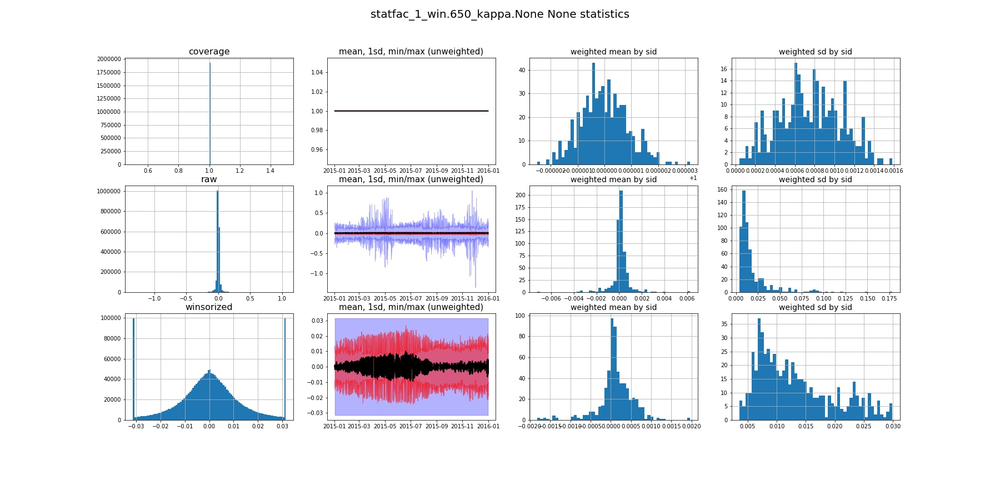

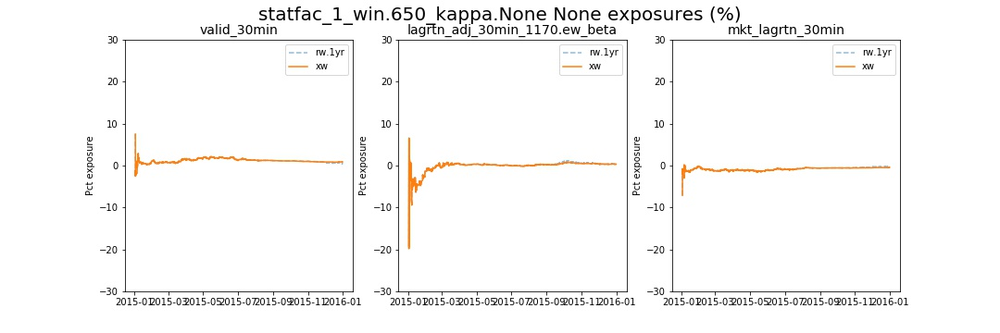

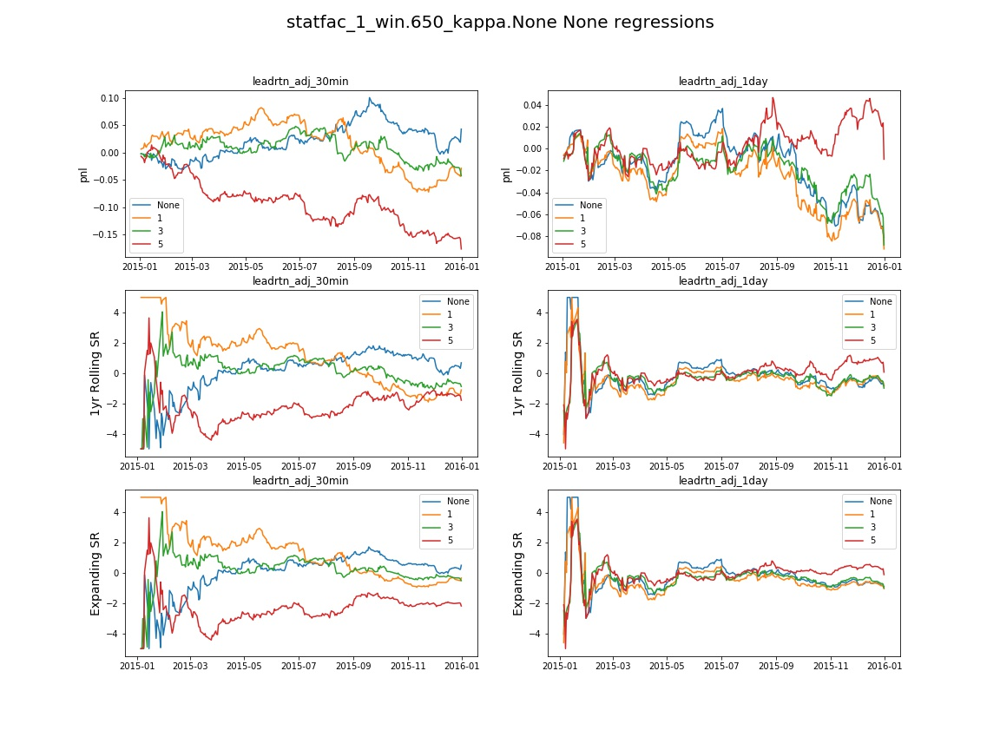

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-0.728632,0.553779,0.000055,0.00008,0.034952,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,0.100807,0.619130,0.000691,4.768372e-07,1.009588,0.855658,0.050546,0.007839,-0.000501
leadrtn_adj_1day,NaN,1931696,0.996036,0.100807,0.388614,0.001465,2.145767e-06,1.910784,1.549442,0.050546,0.007839,-0.000501
leadrtn_adj_30min,1.0,1931696,0.995848,0.101518,0.258767,-0.000646,4.172325e-07,-0.284242,-0.218780,0.050498,0.007847,-0.000532
leadrtn_adj_1day,1.0,1931696,0.995730,0.101518,0.500398,0.001381,1.907349e-06,1.949748,1.622006,0.050498,0.007847,-0.000532
leadrtn_adj_30min,3.0,1931696,0.995237,0.099498,0.551741,0.002264,5.125999e-06,2.865477,2.398940,0.050436,0.007814,-0.000504
leadrtn_adj_1day,3.0,1931696,0.995119,0.099498,0.327948,0.001891,3.576279e-06,2.513668,2.051294,0.050436,0.007814,-0.000504
leadrtn_adj_30min,5.0,1931696,0.994626,0.099036,0.539491,0.000880,7.748604e-07,1.203491,1.054818,0.050443,0.007929,-0.000466
leadrtn_adj_1day,5.0,1931696,0.994508,0.099036,0.032564,0.001544,2.384186e-06,1.946756,1.480235,0.050443,0.007929,-0.000466


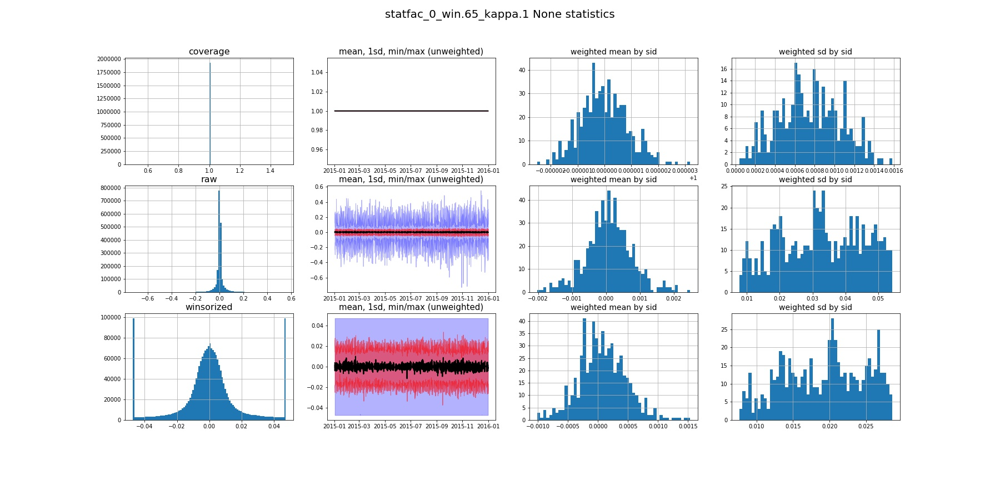

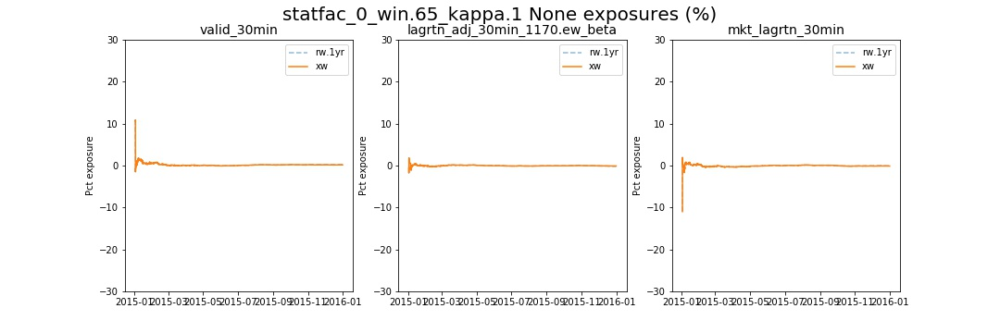

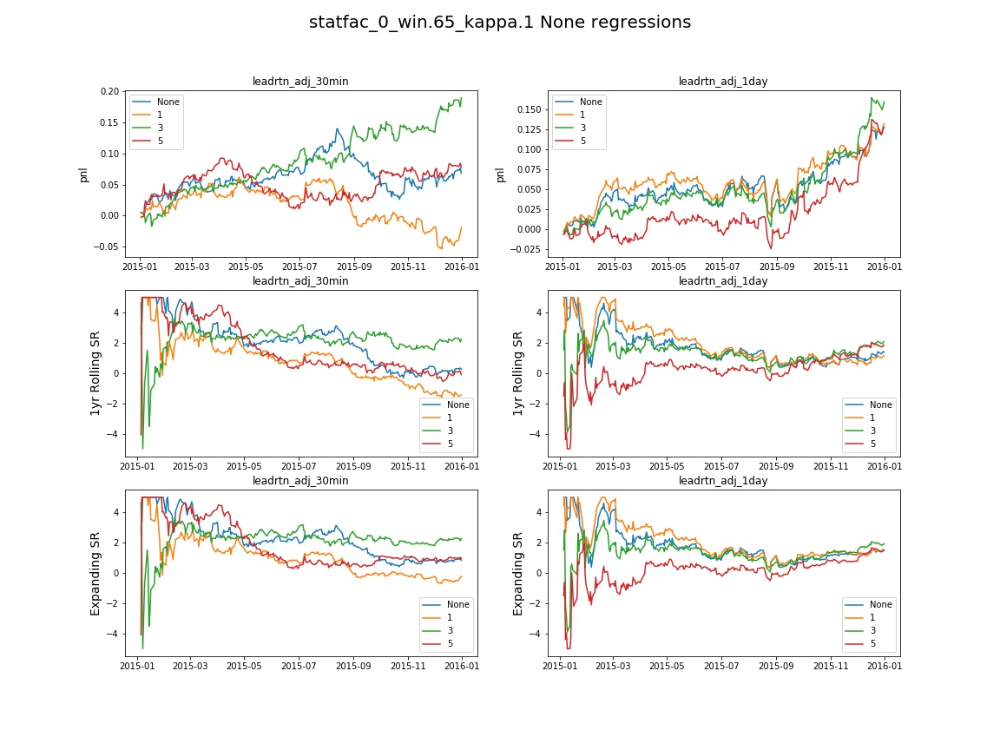

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-0.659004,0.5345,-0.000013,-0.000017,0.034966,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,0.039883,-0.301634,0.000423,1.788139e-07,0.281817,0.211878,0.047854,0.005977,0.003500
leadrtn_adj_1day,NaN,1931696,0.996036,0.039883,-0.833935,-0.001171,1.370907e-06,-1.494167,-1.089654,0.047854,0.005977,0.003500
leadrtn_adj_30min,1.0,1931696,0.995848,0.040651,-0.464781,-0.001269,1.609325e-06,-1.483157,-1.077947,0.047816,0.005981,0.003476
leadrtn_adj_1day,1.0,1931696,0.995730,0.040651,-0.925022,-0.001424,2.026558e-06,-1.911543,-1.478016,0.047816,0.005981,0.003476
leadrtn_adj_30min,3.0,1931696,0.995237,0.040801,0.372275,0.001638,2.682209e-06,2.080472,1.780503,0.047811,0.005960,0.003438
leadrtn_adj_1day,3.0,1931696,0.995119,0.040801,-0.679163,-0.000810,6.556511e-07,-0.994885,-0.827383,0.047811,0.005960,0.003438
leadrtn_adj_30min,5.0,1931696,0.994626,0.032077,-0.054451,0.000423,1.788139e-07,0.458442,0.415839,0.047776,0.005873,0.003456
leadrtn_adj_1day,5.0,1931696,0.994508,0.032077,-0.800038,-0.001424,2.026558e-06,-1.792509,-1.588728,0.047776,0.005873,0.003456


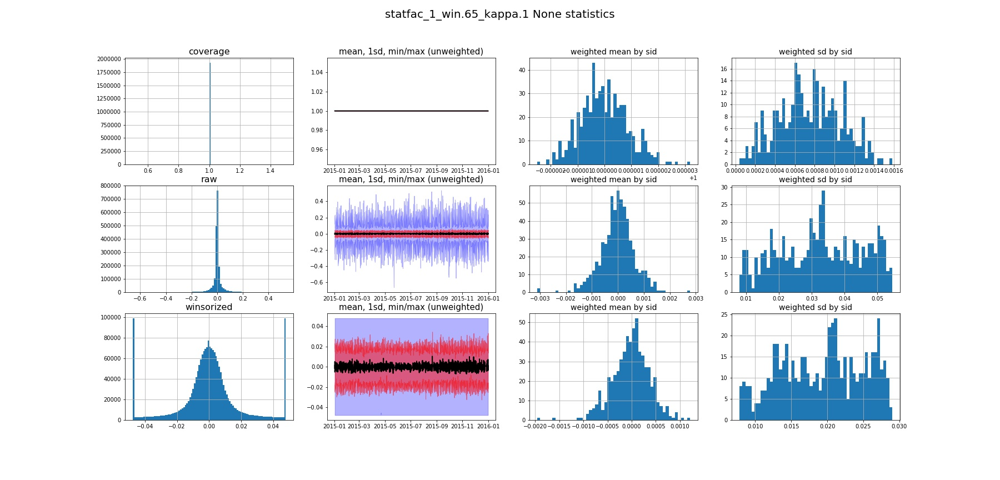

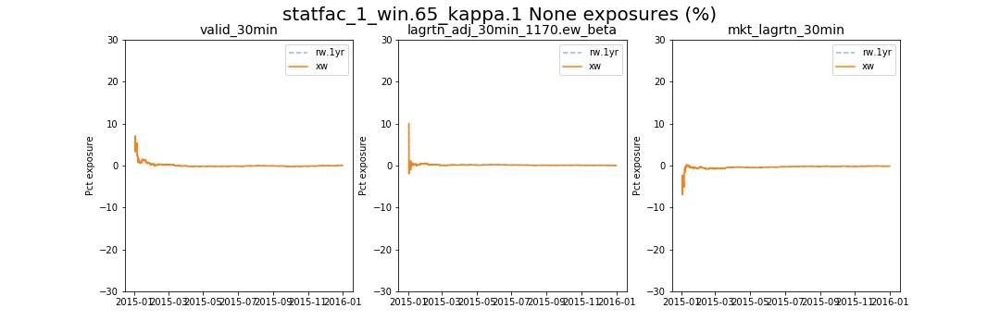

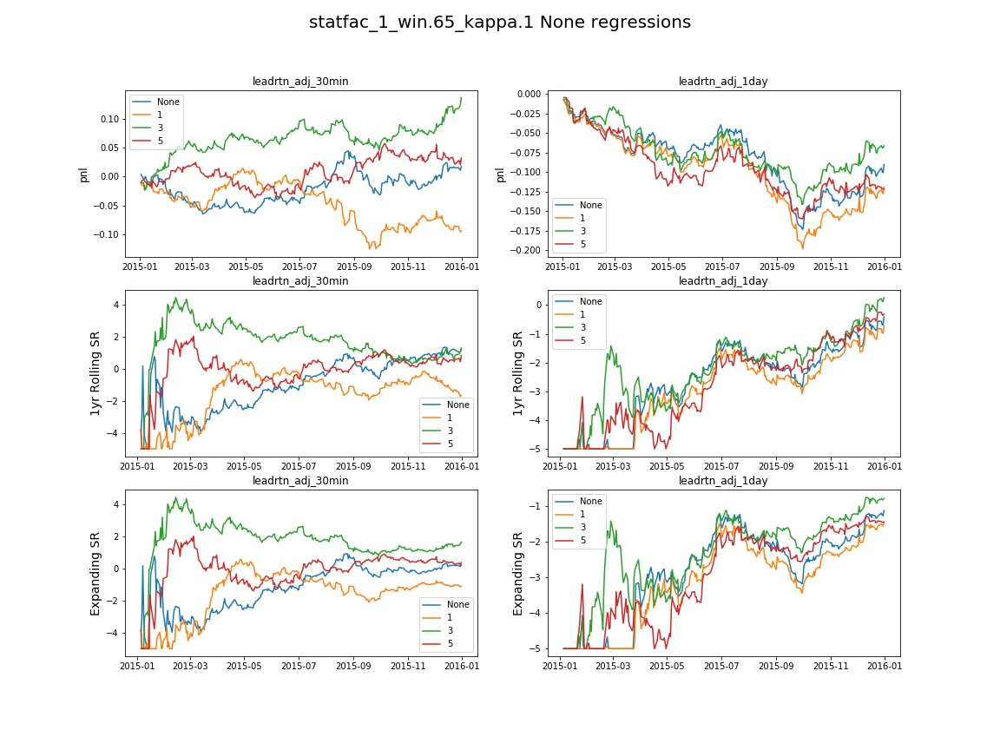

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-1.4258,0.970602,0.000004,0.000035,0.027055,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,0.153314,0.639271,0.004085,1.668930e-05,5.497519,1.214931,0.046592,0.014070,0.011367
leadrtn_adj_1day,NaN,1931696,0.996036,0.153314,0.692509,0.005557,3.087521e-05,7.688617,1.743024,0.046592,0.014070,0.011367
leadrtn_adj_30min,1.0,1931696,0.995848,0.154368,-0.099022,0.000691,4.768372e-07,0.555544,0.119764,0.046316,0.013817,0.011662
leadrtn_adj_1day,1.0,1931696,0.995730,0.154368,0.535607,0.005642,3.182888e-05,7.796041,1.597903,0.046316,0.013817,0.011662
leadrtn_adj_30min,3.0,1931696,0.995237,0.158105,-0.192879,-0.001036,1.072884e-06,-1.215632,-0.330141,0.046347,0.013900,0.011141
leadrtn_adj_1day,3.0,1931696,0.995119,0.158105,0.496877,0.004541,2.062321e-05,6.249358,1.176453,0.046347,0.013900,0.011141
leadrtn_adj_30min,5.0,1931696,0.994626,0.158644,0.286169,-0.002392,5.722046e-06,-3.245618,-0.737664,0.046882,0.013593,0.011213
leadrtn_adj_1day,5.0,1931696,0.994508,0.158644,0.505183,0.003146,9.894371e-06,4.285782,0.847250,0.046882,0.013593,0.011213


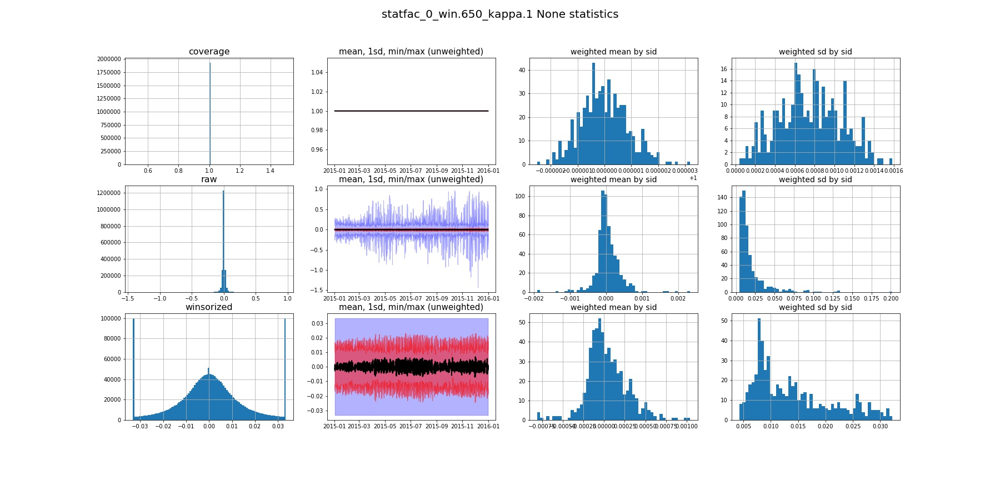

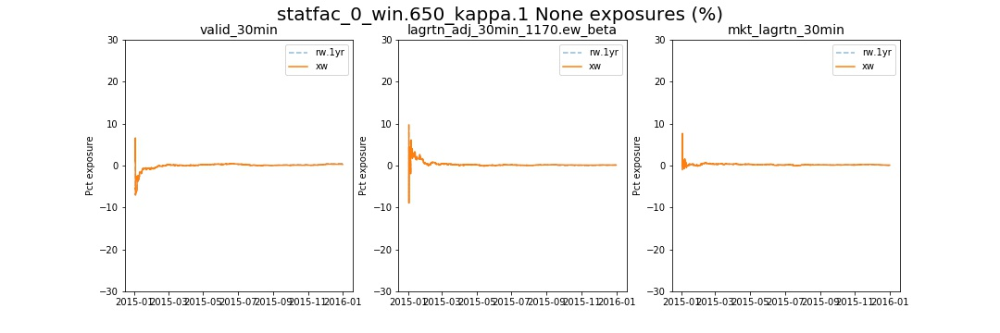

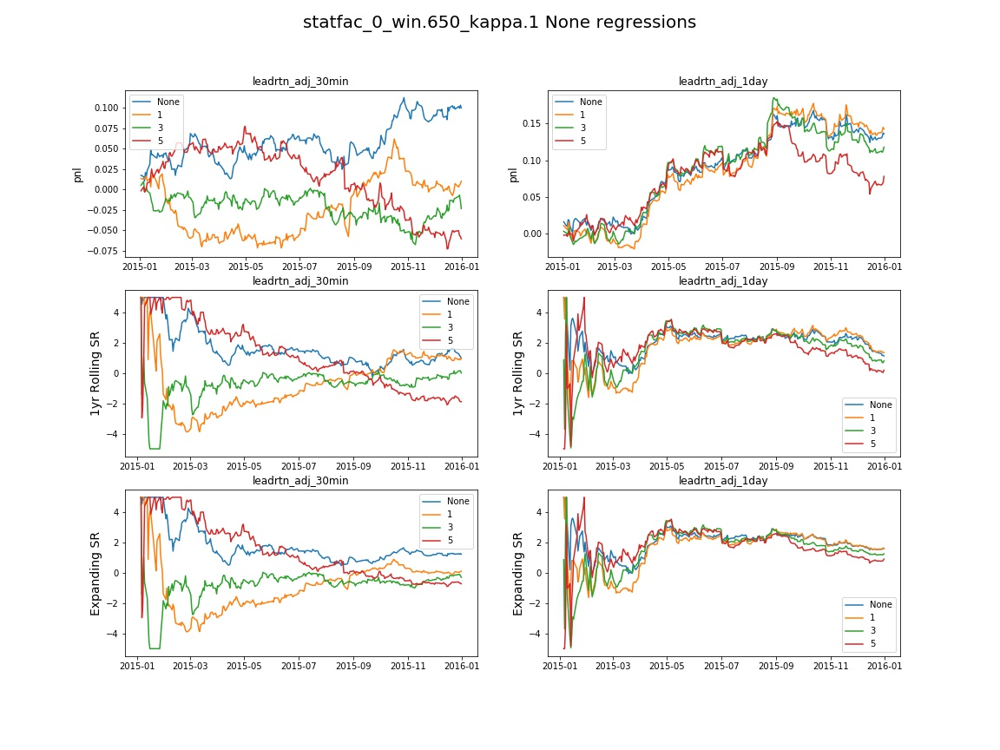

,n,xs,min,max,median,mean,sd,nan_frac,inf_frac,null_frac
value,1931696,None,-1.045444,1.018317,-0.000044,-0.000024,0.027128,0.0,0.0,0.0


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,1931696,0.996153,-0.200340,0.200013,-0.001292,1.668930e-06,-1.505904,-0.294959,0.053773,0.019252,0.001894
leadrtn_adj_1day,NaN,1931696,0.996036,-0.200340,0.237998,0.002224,4.947186e-06,3.106655,0.672105,0.053773,0.019252,0.001894
leadrtn_adj_30min,1.0,1931696,0.995848,-0.200080,0.141260,-0.000423,1.788139e-07,-0.386836,-0.087361,0.054035,0.019482,0.002170
leadrtn_adj_1day,1.0,1931696,0.995730,-0.200080,0.183789,0.003356,1.126528e-05,4.552111,0.910243,0.054035,0.019482,0.002170
leadrtn_adj_30min,3.0,1931696,0.995237,-0.207532,0.559847,0.000691,4.768372e-07,1.017855,0.210673,0.054093,0.019502,0.002221
leadrtn_adj_1day,3.0,1931696,0.995119,-0.207532,0.205680,0.004041,1.633167e-05,5.566424,1.207875,0.054093,0.019502,0.002221
leadrtn_adj_30min,5.0,1931696,0.994626,-0.207410,0.389533,0.010315,1.063943e-04,14.030301,3.477026,0.054619,0.019138,0.002137
leadrtn_adj_1day,5.0,1931696,0.994508,-0.207410,-0.004867,0.001544,2.384186e-06,2.259771,0.517632,0.054619,0.019138,0.002137


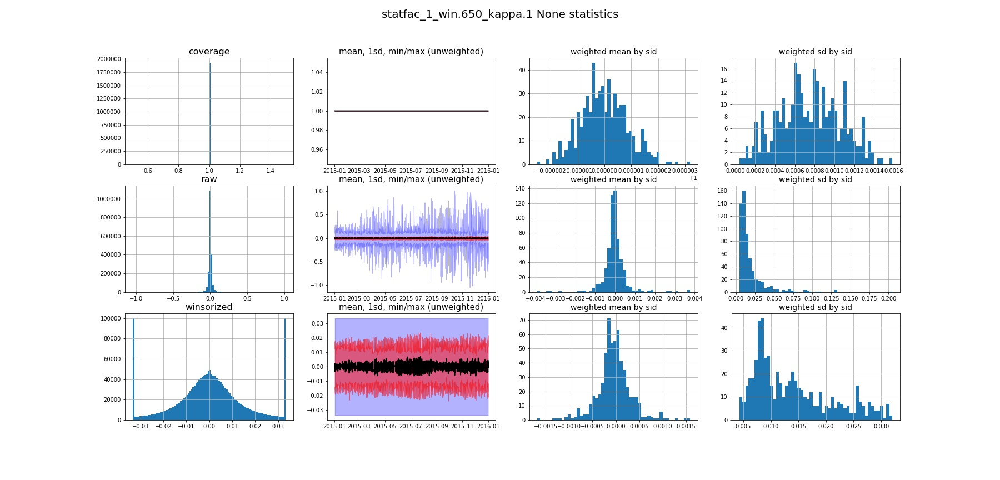

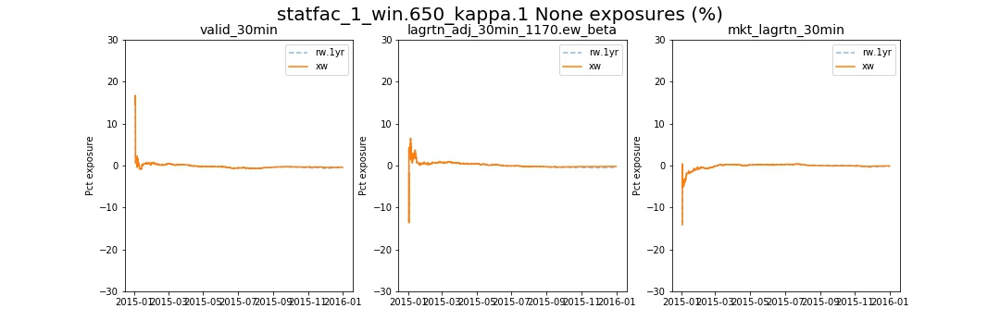

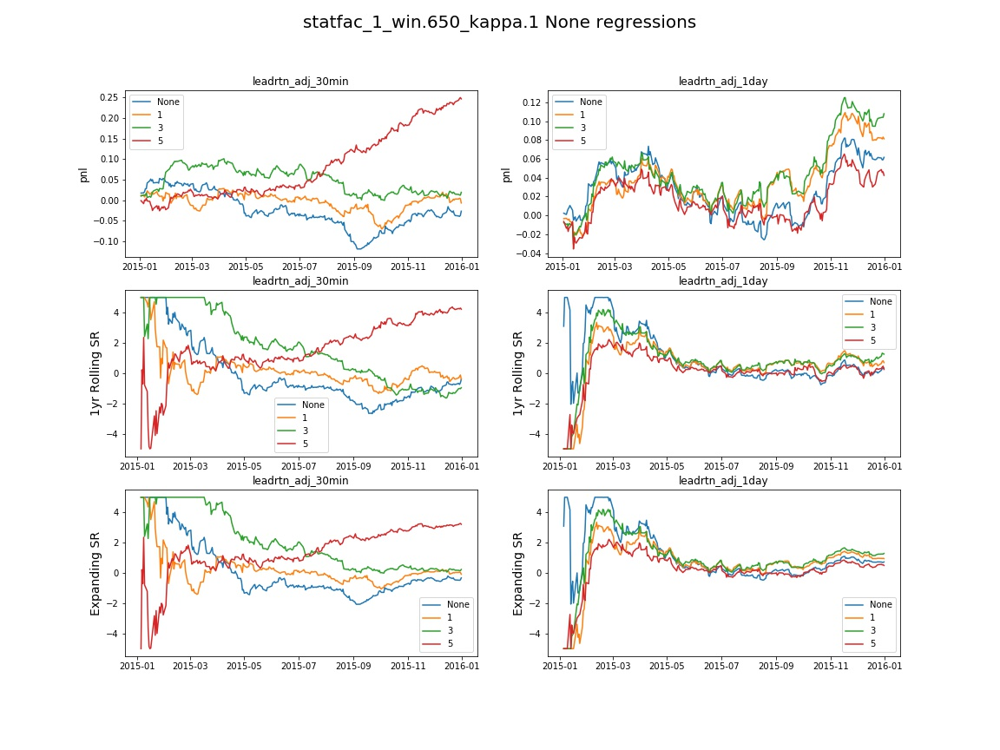

In [6]:
# Add a bunch of statistical factors 
#####################################
mx = mx.reload()
mxtr = mxtr.reload()
mx.Config.start()
from madmax.algos import statfacs as mxs; reload( mxs )
import itertools

data = add_vols

hps.statfac = mx.HPSet(
    start='20110101', #hps.start,
    end='20160101', #hps.end
    windows=[13*5, 13*50],    
    weight='weight',
    rank=2,
    kappa=[-1, None, 1], 
    logdet=1, 
    ortho=100,
    tv={1:1, 2:1e-1, 13:1e-3},
    ortho_features=hps.feature_set.betas,
)

for _ in range( 5 ):
    gc.collect(); tr.cuda.empty_cache()
    
disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )

@mx.operatorize( consumes_features=True, produces_features=True, produces_meta=True, memoize=True )
def BuildStatFacFeatures( data, features, hps=hps.statfac ):
    '''build up a bunch of statisitical features'''
    logger = mx.Logger( 'BuildStatFacFeatures', verbose=True )
    if hps.start:
        data =data.loc[hps.start:]
    if hps.end:
        data =data.loc[:hps.end]        
    output_meta = []
    output_features=[]    
    for kappa, winlen in logger.pbar( itertools.product( hps.kappa, hps.windows ) ):    
        logger.info( 'Winlen', winlen, 'kappa', kappa )
        mx.seed( 17 )
        statfac = mxs.StatFacs.operator(      
            weight=hps.weight,
            #othogonalize out the previously compute statfacs
            ortho_features=hps.ortho_features+output_features,
            device='cuda',
            dtype=tr.float32,
            winlen=winlen,
            rank=hps.rank, 
            kappa=kappa, 
            logdet=hps.logdet, 
            ortho=hps.ortho,
            tv=hps.tv,
            lr=2,
            betas=(0.8, 0.8),     
            batch_size=1000,
            rel_tol=1e-4, 
            max_its=100, 
            verbose=True,
            diagnostics=True,
        )        
        statfac.data = data
        statfac.features  = features
        data = statfac( )
        new_features = [ f'statfac_{k}_win.{winlen}_kappa.{kappa}' for k in range(hps.rank) ]
        data = data.rename_coords( features=dict( zip( statfac.output_features, new_features ) ) )
        output_features.extend( new_features )
        # --- build up the metadata ----
        P, K = len(statfac.features), statfac.kwargs['rank']
        R = len( statfac.ortho_features ) if statfac.ortho_features else None
        result = statfac.output_meta
        assert np.allclose( result['x_norms'], 1 ) 
        result['window'] = winlen
        fig = figure( figsize=(10, 5) )
        ax = subplot(121)
        ax.plot( result['rho2s'].to_dataframe_mx().unstack().values.reshape( -1 ),
              result['diagnostic_rhos'].sq().abs().to_dataframe_mx().unstack().values.reshape( -1 ), '.' )
        ax.set_xlabel( 'original', )
        ax.set_ylabel( 'diagnostic', )
        ax.set_title('rho')
        ax = subplot(122)
        ax.plot( result['ortho_rho2s'].to_dataframe_mx().unstack().values.reshape( -1 ),
                 result['diagnostic_ortho_rhos'].sq().abs().to_dataframe_mx().unstack().values.reshape( -1 ), '.' )
        ax.set_xlabel( 'original', )
        ax.set_ylabel( 'diagnostic', )
        ax.set_title('ortho rho')
        fig.suptitle( 'diagnositc vs original', fontsize=15 )
        result['rho2_vs_r2'] = mx.fig2format( fig )
        fig, axs = subplots(P, K , figsize=(K * 4, P * 4) )
        axs = np.atleast_2d( axs )
        for p in range( P ):
            for k in range( K ):
                ax = axs[p][k]
                ax.plot( result['diagnostic_rhos'][:, k, p].sq().to_series().rolling( statfac.kwargs['winlen'] ).mean(), 
                         '--k', label='statfac r' )
                ax.set_ylabel( 'rho^2', fontsize=14 )                
                ax.set_title( f'factor {k}, target {p}', fontsize=14 )    
        fig.suptitle( 'Rolling r^2', fontsize=15 )
        result['rolling_r2'] = mx.fig2format( fig )        
        if R:
            fig, axs = subplots( R, K , figsize=(K * 4, R * 4) )
            axs = np.atleast_2d( axs )
            for r in range( R ):
                for k in range( K ):
                    ax = axs[r][k]
                    ax.plot( result['diagnostic_ortho_rhos'][:, k, r].sq().to_series().rolling( statfac.kwargs['winlen'] ).mean(), 
                             '--k', label='statfac r' )
                    ax.set_ylabel( 'ortho rho^2', fontsize=14 )                
                    ax.set_title( f'factor {k}, orthog {r}', fontsize=14 )    
            fig.suptitle( 'Rolling orthogonal r^2', fontsize=15 )
            result['rolling_ortho_r2'] = mx.fig2format( fig )        
        output_meta.append( result )
        del statfac; gc.collect() 
    return data, output_features, output_meta

statfac_feature_builder = BuildStatFacFeatures( )
statfac_feature_builder.data = add_vols
statfac_feature_builder.features = ['lagrtn_adj_30min', 'lagrtn_adj_1day']
disp( 'expected BuildStatFacFeatures_52714267e got ', statfac_feature_builder.hash() )
da = statfac_feature_builder()

output_meta = statfac_feature_builder.output_meta
for result in output_meta:
    disp( 'window length', result['window'], h=2 )
    #disp( 'factor correlations', result['corrs'], corr=True,  h=4 )
    disp( 'factor autocorrelations', result['autocorrs'], corr=True, h=4 )
    disp( 'runtime profiles', result['profiles'], h=4 )
    #disp( result['rho2_vs_r2'] )
    #disp( result['rolling_r2'] )
    # disp( result['rolling_ortho_r2'] )
    
# add this to the feature set
hps.feature_set.statfac=statfac_feature_builder.output_features

# profile the statfacs
disp( 'profiling ',  hps.feature_set.statfac, h=2 )
corr_df, profiler = process_one_feature_set( data=statfac_feature_builder, fs_features= hps.feature_set.statfac ) 
mx.disp( corr_df, corr=True )    
profiler.display()     


## define the online runner operator

In [4]:
# define the onlinerunner operator
####################
mx.online = mx.online.reload()

@mx.operatorize( memoize=True, consumes_features=False, produces_features=True, produces_meta=True )
def OnlineRunner( da, hps, tensorboard=True, verbose=True ):
    ''' run one configuration end to end''' 
    logger = mx.Logger( 'OnlineRunner' )
    da_use = da.loc[hps.start:hps.end]
    # make sure you don't squeeze out this dimension !
    if hps.symbol:
        da_use = da_use.sel( symbol=mx.make_iterable(hps.symbol ) )            
    features = list( hps.features )
    output_features = []

    # this round about shit is because cloudpickl in the memoization fucks up nan checks in ema-updater
    if hps.transformer:
        tfs = []
        if hps.transformer.pre_normalize:
            tfs.append( mx.online.OnlineNorm( demean=True, normalize=True ) )
        if hps.transformer.quadratic:
            tfs.append( mx.online.OnlineFeatures( transform='quadratic')  )
        if hps.transformer.ema_halflifes:
            tfs.append( mx.online.OnlineEma( halflifes=hps.transformer.ema_halflifes ) )
        if hps.transformer.post_normalize:
            tfs.append( mx.online.OnlineNorm( demean=True, normalize=True ) )
        transformer = tr.nn.Sequential( *tfs )
    else:
        transformer = None

    if hps.pre_winsorize:
        with logger.timer( '# pre-winsorize teh input features'):
            wins = mx.transforms.batch( sid='symbol' ).winsorize( quantiles=0.05 )
            da_use = wins( da_use, features=features )
            features = wins.output_features
        
    X = da_use.loc[:, :, features ]
    Y = da_use.loc[:, :, [hps.target]]
    # advance the target  and add thsi to the lookahead
    if hps.target_shift:
        Y = Y.lag( -hps.target_shift )
        hps.lookahead += hps.target_shift
    W = da_use.loc[:, :, [hps.weight]]
    Z = da_use.loc[:,:, hps.ortho_features ]
    
    # demean X
    if hps.batch_demean:
        X = ( X - X.mean( dim=['time','symbol']) )
    if hps.batch_normalize:
        X = X / ( X.sq().mean( dim=['time','symbol']).sqrt() + 1e-13 )        
        
    for _ in range( 5 ):
        gc.collect(); tr.cuda.empty_cache()

    Xt = X.fillna(0).to_tensor( dtype=dtype, device=device )
    Yt = Y.fillna(0).to_tensor( dtype=dtype, device=device )
    Wt = W.fillna(0).to_tensor( dtype=dtype, device=device )
    Zt = Z.fillna(0).to_tensor( dtype=dtype, device=device )
    
    with logger.timer(" the linear rnn learner"):
        linear_rnn = mx.online.OnlineRNN(
            lookahead=hps.lookahead, 
            ridge=hps.ridge, 
            kappa=hps.kappa, 
            algo=hps.algo,
            halflife_1=hps.hl_1,
            halflife_2=hps.hl_2,
            lr=hps.lr,
            tv=hps.rnn_tv,
            ortho=hps.ortho,
            use_omega=hps.use_omega,
            omega_lr=hps.omega_lr,
            omega_ridge=hps.omega_ridge,
            omega_shift=hps.omega_shift,
            halflife_ortho=hps.ortho_hl,
            transformer=transformer,            
        ) 
        linear_rnn.verbose = verbose 
        Yht, meta, state = linear_rnn( X=Xt, Y=Yt, W=Wt, Z=Zt, )    
        disp( 'runtimes for the online rnn', linear_rnn.profiles )
        del linear_rnn;    tr.cuda.empty_cache()        
        # convert resutls to dataarray
        output_feature = f'{hps.target}_hat'
        da_use = da_use.assign_features( **{output_feature: Yht.squeeze(-1).to_dataarray( Y.squeeze(axis=-1) )  } )
        output_features.append( output_feature )        

    # drop some initial data for online priming
    da_use = da_use[500:]
    del Xt, Yt, Wt, Zt, Yht;    
    for _ in range( 5 ):
        gc.collect(); tr.cuda.empty_cache()

    
    with logger.timer('  winsorizations'):
        wins = mx.transforms.batch( sid='symbol' ).winsorize( quantiles=0.05 )
        da_use = wins( da_use, features=output_features )    
        output_features += wins.output_features

    with logger.timer( 'profiling ' ): 
        profiler = mx.FeatureProfiler(
            returns=['leadrtn_adj_30min', 'leadrtn_adj_1hr' ],
            exposures=hps.exposures,
            transforms=None, weight=hps.weight, winsorize=None, xs=None, 
            lags=[1, 2], autocorr=[1, 2, 13], remove_intercept=False,
        ).set(verbose=False, memoize=False)
        profiler.data = da_use
        profiler.features = output_features
        profiler.run()
    
    return da_use, output_features,  profiler.output_meta

## baseline online model without statfac or statface residualization

/home/fj/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1391: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


,num_calls,duration_total,duration_mean,duration_squared,duration_std
_one_step_in_beta,15002,140.481065,0.009364,0.000088,0.000795
_one_step_in_omega,15002,18.767183,0.001251,0.000002,0.000151


/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,8585184,0.882907,-0.364854,0.408999,0.005990,0.000036,16.400158,3.318624,0.558452,0.457790,0.475585
leadrtn_adj_1hr,NaN,8585184,0.882906,-0.364854,0.421995,0.006319,0.000040,17.003531,2.907316,0.558452,0.457790,0.475585
leadrtn_adj_30min,1.0,8585184,0.882851,-1.102520,0.230365,0.002730,0.000007,7.526843,1.486524,0.564593,0.462682,0.478716
leadrtn_adj_1hr,1.0,8585184,0.882850,-1.102520,0.310427,0.004683,0.000022,12.368366,2.307142,0.564593,0.462682,0.478716
leadrtn_adj_30min,2.0,8585184,0.882793,-1.152282,0.271086,0.004150,0.000017,11.186784,2.655279,0.566749,0.464165,0.479032
leadrtn_adj_1hr,2.0,8585184,0.882792,-1.152282,0.320861,0.003703,0.000014,9.576604,1.822728,0.566749,0.464165,0.479032


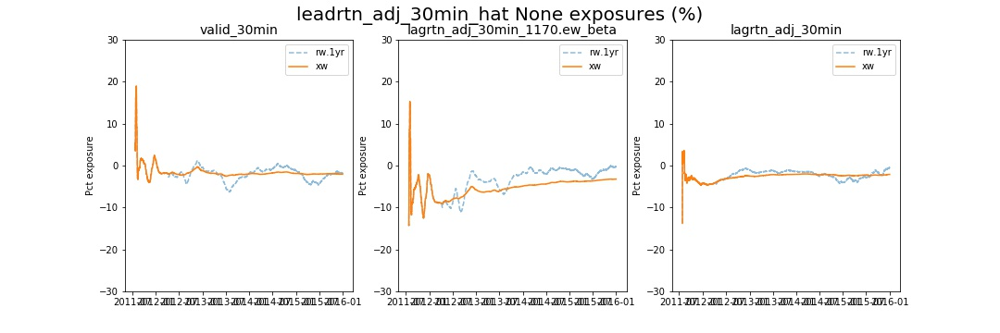

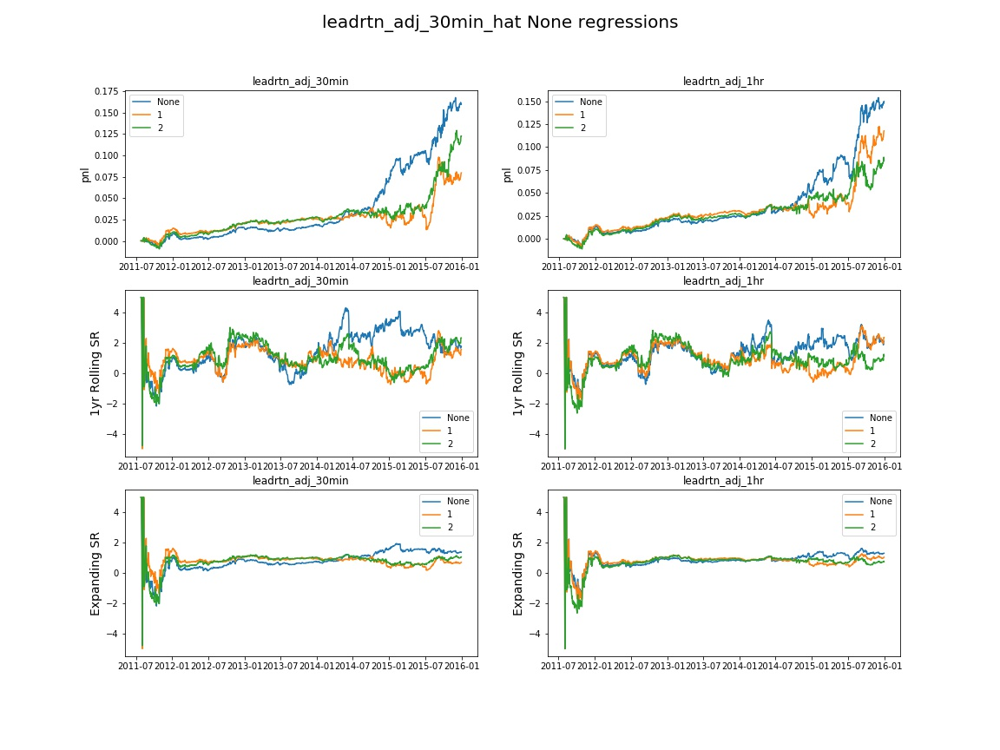

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,8585184,0.882907,-1.843911,0.411156,0.005404,0.000029,14.777165,3.342287,0.678956,0.615283,0.623977
leadrtn_adj_1hr,NaN,8585184,0.882906,-1.843911,0.437682,0.006094,0.000037,16.316042,3.067780,0.678956,0.615283,0.623977
leadrtn_adj_30min,1.0,8585184,0.882851,-2.838633,0.256734,0.003400,0.000012,9.011301,2.022916,0.683543,0.619028,0.626810
leadrtn_adj_1hr,1.0,8585184,0.882850,-2.838633,0.367119,0.005150,0.000027,13.795134,2.679262,0.683543,0.619028,0.626810
leadrtn_adj_30min,2.0,8585184,0.882793,-2.895624,0.331753,0.004495,0.000020,12.321151,3.409866,0.684986,0.619787,0.626834
leadrtn_adj_1hr,2.0,8585184,0.882792,-2.895624,0.378875,0.004747,0.000023,12.632809,2.607066,0.684986,0.619787,0.626834


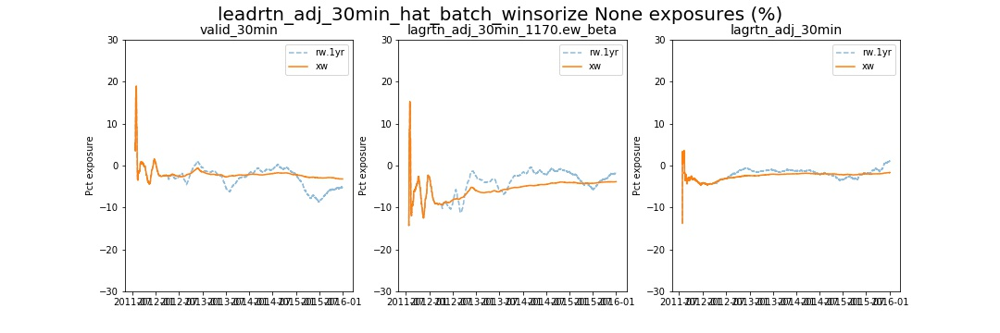

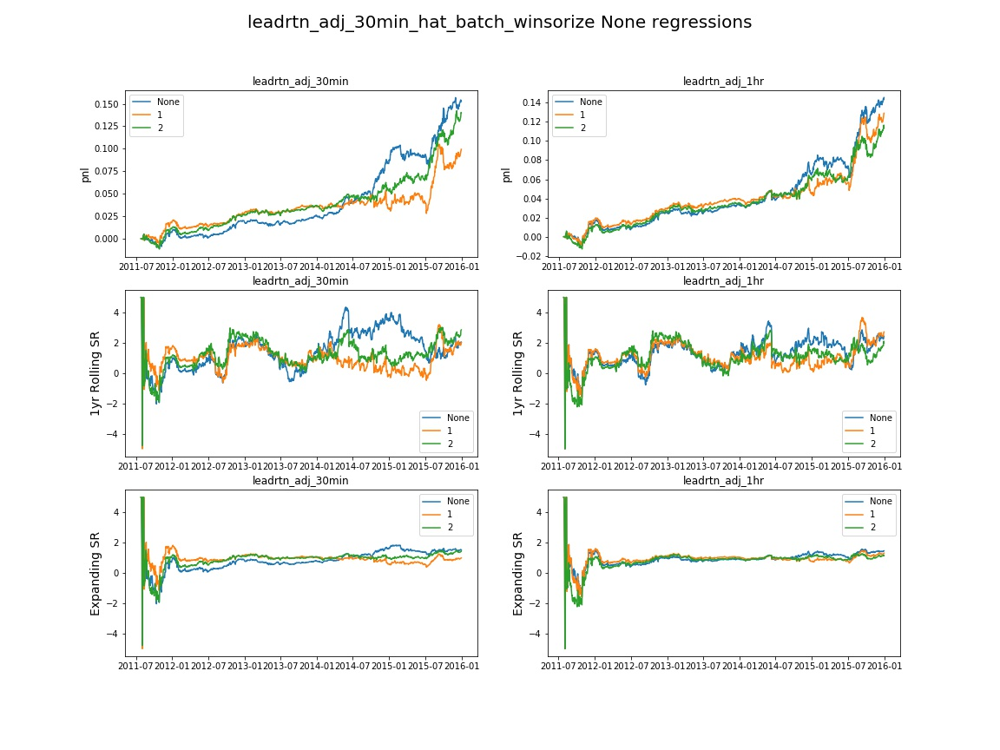

In [35]:
# baseling online learning model without statistical factors
##############################################
%inline
mx = mx.reload()
mxtr = mxtr.reload()
mx.online = mx.online.reload()
mx.Config.start()

data = statfac_feature_builder

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20110601', #hps.start,
    end='20160101', #hps.end
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
        #+ hps.feature_set.statfac
        # + hps.feature_set.vol 
        #+ hps.feature_set.log_volumes
        #+ hps.feature_set.calendar
        # + hps.feature_set.mkt 
        # + hps.feature_set.betas
        #+ hps.feature_set.technical
        #+ hps.feature_set.afacs
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None, # advance the target
    lookahead=2,
    ridge=1e-5,
    hl_1 = 50,
    hl_2 = 1000,
    lr = 100,
    kappa=2, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13*10,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas, # + hps.feature_set.statfac,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega='P',
    omega_lr = 10,
    omega_ridge = 0,
    omega_shift = 0.1,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min']
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )  

## Online model with statfac features 

/home/fj/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1391: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


,num_calls,duration_total,duration_mean,duration_squared,duration_std
_one_step_in_beta,15002,315.815773,0.021050,4.454449e-04,0.001528
_one_step_in_omega,15002,0.361039,0.000024,5.842203e-10,0.000002


/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,8585184,0.882907,-0.153898,0.111976,0.003136,0.000010,8.735203,1.872234,0.821050,0.800912,0.782909
leadrtn_adj_1hr,NaN,8585184,0.882906,-0.153898,0.082384,0.002878,0.000008,8.055213,1.406099,0.821050,0.800912,0.782909
leadrtn_adj_30min,1.0,8585184,0.882851,-0.410434,0.001670,0.001171,0.000001,3.277755,0.781105,0.823485,0.802902,0.784438
leadrtn_adj_1hr,1.0,8585184,0.882850,-0.410434,0.033847,0.002549,0.000006,6.853295,1.256729,0.823485,0.802902,0.784438
leadrtn_adj_30min,2.0,8585184,0.882793,-0.426467,0.056418,0.002429,0.000006,6.989707,1.618520,0.823927,0.803227,0.784762
leadrtn_adj_1hr,2.0,8585184,0.882792,-0.426467,0.011172,0.001827,0.000003,5.073372,0.922550,0.823927,0.803227,0.784762


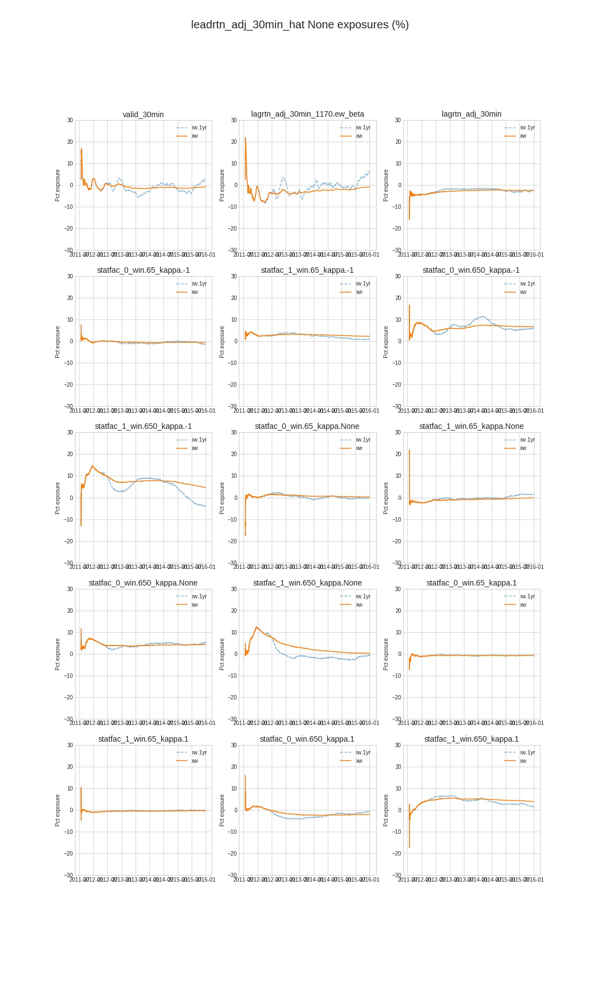

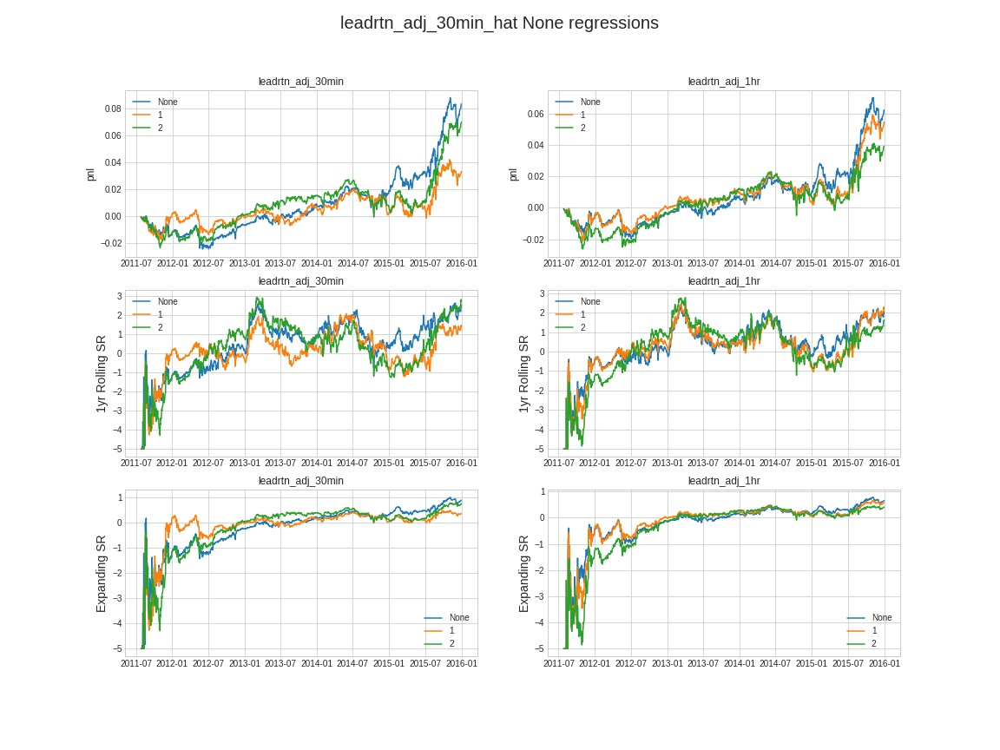

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,8585184,0.882907,-0.281378,0.099071,0.002429,0.000006,6.671002,1.528862,0.854278,0.839612,0.821517
leadrtn_adj_1hr,NaN,8585184,0.882906,-0.281378,0.056595,0.002100,0.000004,6.008274,1.119771,0.854278,0.839612,0.821517
leadrtn_adj_30min,1.0,8585184,0.882851,-0.562428,-0.009036,0.001036,0.000001,2.861737,0.725246,0.855677,0.840872,0.822434
leadrtn_adj_1hr,1.0,8585184,0.882850,-0.562428,0.031908,0.002100,0.000004,5.732615,1.113437,0.855677,0.840872,0.822434
leadrtn_adj_30min,2.0,8585184,0.882793,-0.578950,0.073608,0.002100,0.000004,6.127501,1.509340,0.855968,0.841116,0.822810
leadrtn_adj_1hr,2.0,8585184,0.882792,-0.578950,0.039926,0.002043,0.000004,5.775548,1.089471,0.855968,0.841116,0.822810


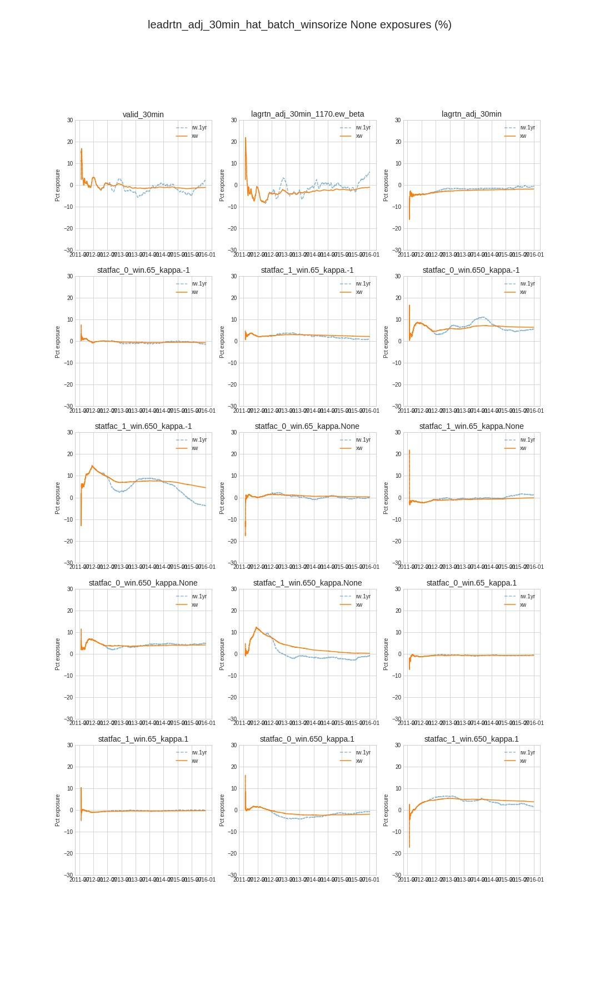

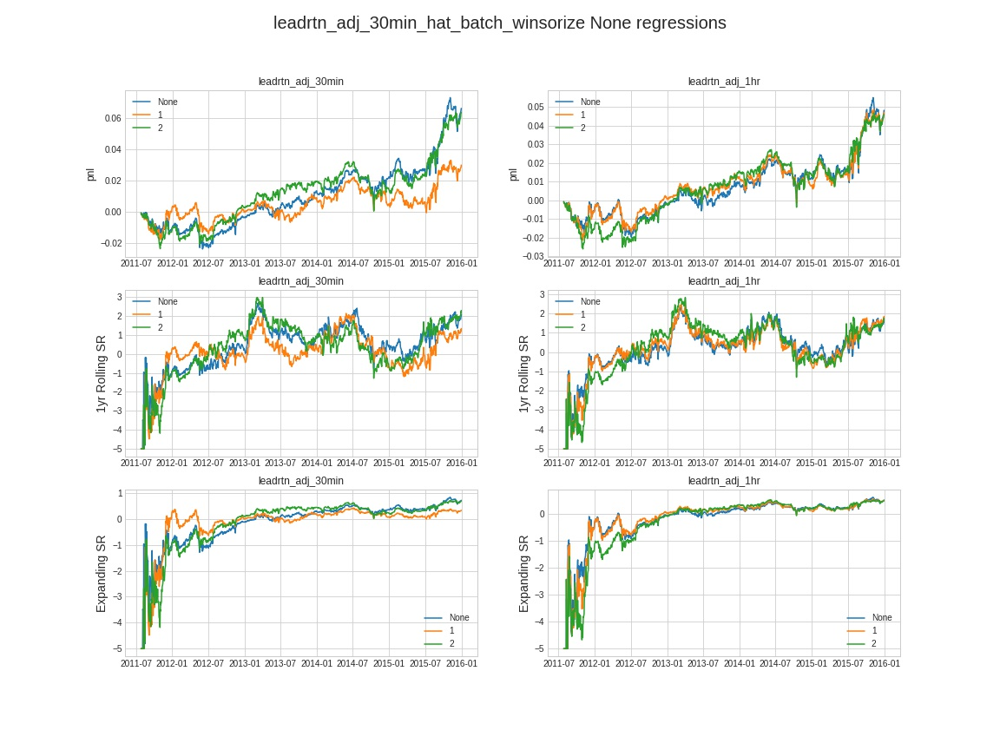

In [51]:
# online learning model with statistical factors 
##############################################
%inline
mx = mx.reload()
mxtr = mxtr.reload()
mx.online = mx.online.reload()
mx.Config.start()

data = statfac_feature_builder

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20110601', #hps.start,
    end='20160101', #hps.end
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
        + hps.feature_set.statfac
#         + hps.feature_set.vol 
#         + hps.feature_set.log_volumes
        #+ hps.feature_set.calendar
#         + hps.feature_set.mkt 
#         + hps.feature_set.betas
        #+ hps.feature_set.technical
        #+ hps.feature_set.afacs
    ) ),
    symbol=None,
    target='leadrtn_adj_30min',
    target_shift=None, # advance the target
    lookahead=2,
    ridge=1e-6,
    hl_1 = 50,
    hl_2 = 1000,
    lr = 100,
    kappa=5, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13*10,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas, #+ hps.feature_set.statfac,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega=None,
    omega_lr = 1,
    omega_ridge = 0,
    omega_shift = None,
    pre_winsorize=0.01,
    batch_demean=False,b
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'] + hps.feature_set.statfac
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )  

## Statfac model - against daily returns

/home/fj/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1391: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


,num_calls,duration_total,duration_mean,duration_squared,duration_std
_one_step_in_beta,15002,316.936450,0.021125,4.488627e-04,0.001613
_one_step_in_omega,15002,0.361792,0.000024,5.874791e-10,0.000002


/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)
/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,8585184,0.882907,-0.037988,0.123984,0.003638,0.000013,9.976976,1.856569,0.972528,0.968743,0.927808
leadrtn_adj_1hr,NaN,8585184,0.882906,-0.037988,0.134241,0.004299,0.000018,11.736823,1.551268,0.972528,0.968743,0.927808
leadrtn_adj_30min,1.0,8585184,0.882851,-0.061015,0.067540,0.002561,0.000007,6.925923,1.254489,0.972567,0.968769,0.927822
leadrtn_adj_1hr,1.0,8585184,0.882850,-0.061015,0.104217,0.003967,0.000016,10.461293,1.375569,0.972567,0.968769,0.927822
leadrtn_adj_30min,2.0,8585184,0.882793,-0.062272,0.078987,0.003010,0.000009,8.133163,1.499192,0.972609,0.968802,0.927815
leadrtn_adj_1hr,2.0,8585184,0.882792,-0.062272,0.101585,0.003883,0.000015,10.342238,1.364296,0.972609,0.968802,0.927815


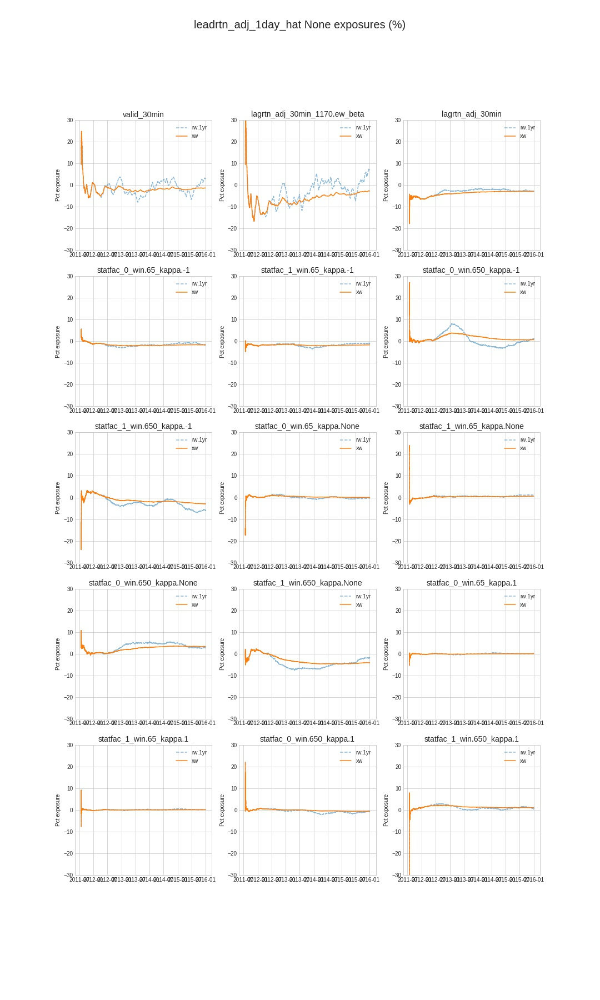

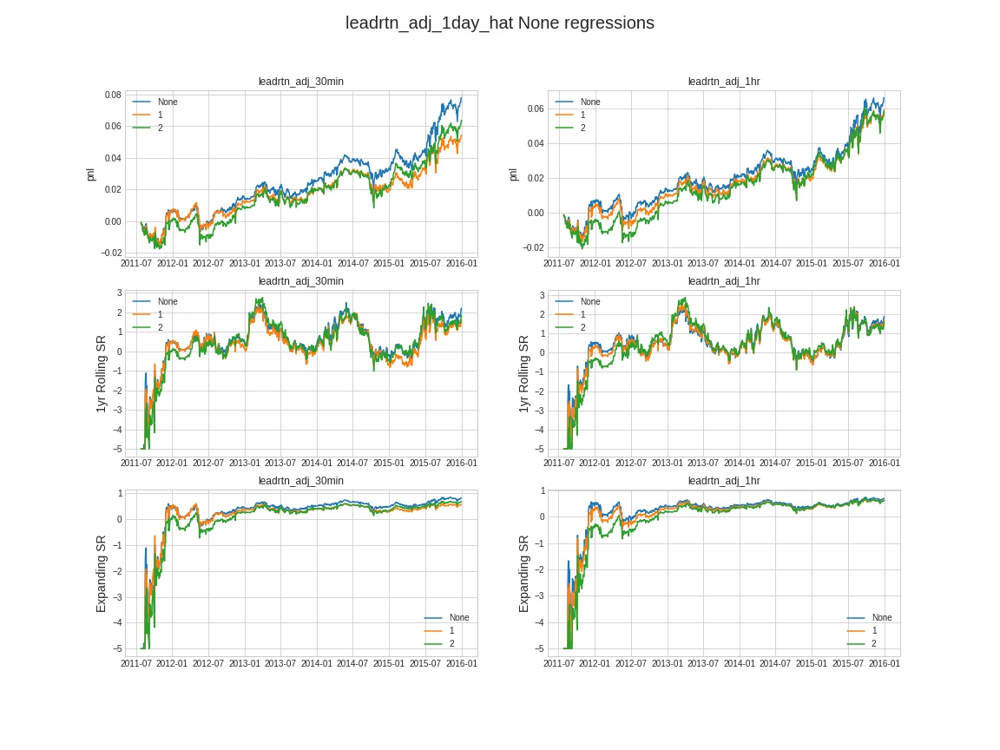

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_30min,NaN,8585184,0.882907,-0.055885,0.121177,0.003418,0.000012,9.424220,1.786702,0.972247,0.968458,0.928208
leadrtn_adj_1hr,NaN,8585184,0.882906,-0.055885,0.132897,0.004172,0.000017,11.279172,1.525194,0.972247,0.968458,0.928208
leadrtn_adj_30min,1.0,8585184,0.882851,-0.081696,0.070344,0.002549,0.000006,6.882195,1.273440,0.972280,0.968494,0.928213
leadrtn_adj_1hr,1.0,8585184,0.882850,-0.081696,0.104636,0.003821,0.000015,10.189026,1.367413,0.972280,0.968494,0.928213
leadrtn_adj_30min,2.0,8585184,0.882793,-0.083098,0.080819,0.002878,0.000008,7.896371,1.476195,0.972339,0.968528,0.928244
leadrtn_adj_1hr,2.0,8585184,0.882792,-0.083098,0.097657,0.003719,0.000014,9.868461,1.327084,0.972339,0.968528,0.928244


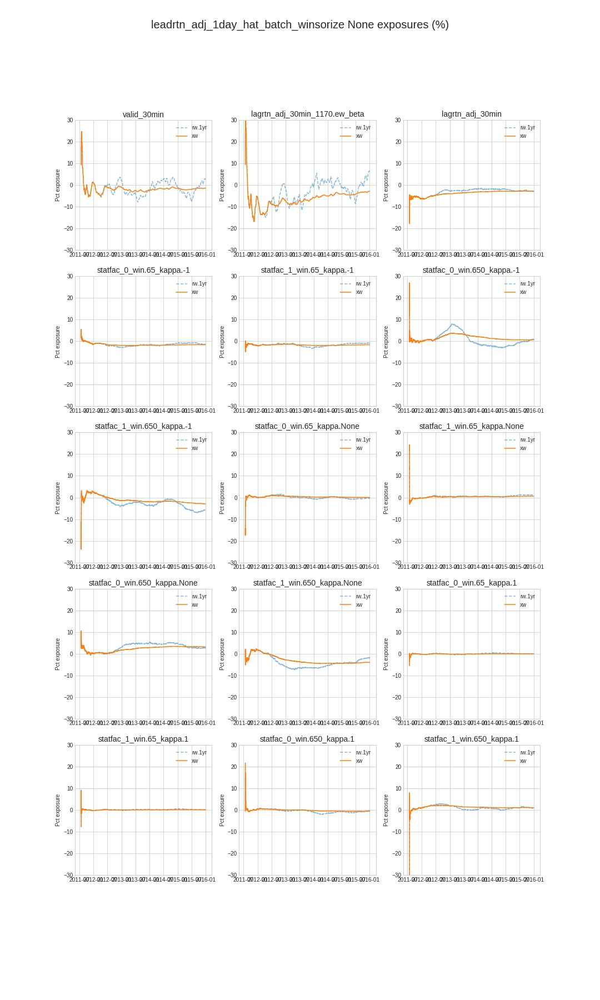

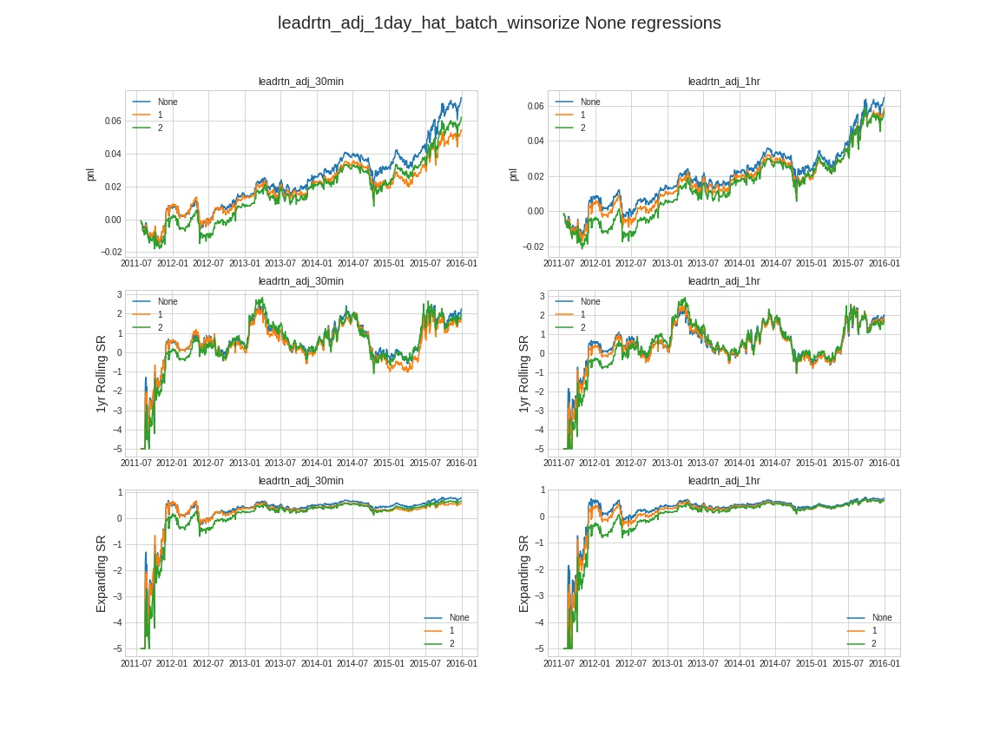

In [61]:
# online learning model with statistical factors 
##############################################
%inline
mx = mx.reload()
mxtr = mxtr.reload()
mx.online = mx.online.reload()
mx.Config.start()

data = statfac_feature_builder

disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )
  
hps.online = mx.HPSet(
    start='20110601', #hps.start,
    end='20160101', #hps.end
    features=sorted( set(
        []
        +['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid',  ] 
        + hps.feature_set.lagging 
        + hps.feature_set.statfac
#         + hps.feature_set.vol 
#         + hps.feature_set.log_volumes
        #+ hps.feature_set.calendar
#         + hps.feature_set.mkt 
#         + hps.feature_set.betas
        #+ hps.feature_set.technical
        #+ hps.feature_set.afacs
    ) ),
    symbol=None,
    target='leadrtn_adj_1day',
    target_shift=None, # advance the target
    lookahead=14,
    ridge=1e-6,
    hl_1 = 50,
    hl_2 = 1000,
    lr = 100,
    kappa=5, # util penalty
    rnn_tv=None, #{1:1, 2:1, 13:1e-1},
    ortho=2,
    ortho_hl=13*10,
    # orthogonalize out short term mean reversion
    ortho_features = ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas, #+ hps.feature_set.statfac,
    weight='valid_30min',
    algo='mbprox', 
    # stuff related to sid weighting
    use_omega=None,
    omega_lr = 1,
    omega_ridge = 0,
    omega_shift = None,
    pre_winsorize=0.01,
    batch_demean=False,
    batch_normalize=False,
    transformer=mx.HPSet( pre_normalize=True, quadratic=True, post_normalize=True, ema_halflifes=[13*5, 13*20, 13*40],  ),
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'] + hps.feature_set.statfac
)

#--- run a basic configuration ---
if True:
    hpso = hps.online
    runner = OnlineRunner( hps=hpso, verbose=True )
    runner.data = data
    disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
    dfo = runner( )
    disp( hpso )
    for profile in runner.output_meta                    :
        main_fig = profile.pop( 'main_fig' )
        exp_fig = profile.pop( 'exp_fig' )
        reg_fig = profile.pop( 'reg_fig' )
        reg_df = profile.pop( 'regressions' )
        if not reg_df.empty:
            reg_df = reg_df.set_index( ['returns', 'lag'] )
        disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
        # disp( pd.DataFrame( profile, index=['value'] ) )
        disp( 'Regressions', reg_df, h=4 )
        # disp( main_fig )
        disp( exp_fig )
        disp( reg_fig )  

In [ ]:
#--- run a grid ---
for hl_2 in [1000, 5000, 10000]:
    for hl_1 in [50, 100, 1000]:
        hpso = hps.online.clone( hl_1=hl_1, hl_2=hl_2 )
        runner = OnlineRunner( hps=hpso, verbose=True )
        runner.data = data
        disp( f'Running runner={runner.hash()} with hps={hpso.hash()}', h=2 )
        dfo = runner( )
        disp( hpso )
        for profile in runner.output_meta                    :
            main_fig = profile.pop( 'main_fig' )
            exp_fig = profile.pop( 'exp_fig' )
            reg_fig = profile.pop( 'reg_fig' )
            reg_df = profile.pop( 'regressions' )
            if not reg_df.empty:
                reg_df = reg_df.set_index( ['returns', 'lag'] )
            disp( profile.pop( 'feature' ), profile.pop( 'transform' ), h=3, hr=True )
            # disp( pd.DataFrame( profile, index=['value'] ) )
            disp( 'Regressions', reg_df, h=4 )
            # disp( main_fig )
            disp( exp_fig )
            disp( reg_fig )  

In [ ]:
# Test statistical factors
###########################################################

%inline
mx = mx.reload()
mxtr = mxtr.reload()
mx.Config.start()
from madmax.algos import statfacs as mxs; reload( mxs )

da_use = da.loc['20150101':'20180101']

for winlen in [13*5, 13*15, 13*50]:    
    disp( mx.tensorboard.start_server() )
    disp( mx.tensorboard.start( clear=True ) )
    
    disp( 'Winlen', winlen, h=1 )
    statfac = mxs.StatFacs.operator(      
        batch_size=1000,
        weight='weight',
        ortho_features=None,
        device='cuda',
        dtype=tr.float32,
        winlen=winlen,
        rank=5, 
        kappa=1, 
        logdet=1, 
        ortho=None,
        tv={1:1, 2:1e-1, 13:1e-3},
        lr=1,
        betas=(0.8, 0.8),     
        rel_tol=1e-3, 
        max_its=100, 
        verbose=True,
        diagnostics=True,
    )
    statfac.data = da_use
    statfac.features  = ['lagrtn_adj_30min']
    dao = statfac( )

    P, K = len(statfac.features), statfac.kwargs['rank']

    result = statfac.output_meta

    assert np.allclose( result['x_norms'], 1 ) 

    disp( 'factor correlations', h=4 )
    disp( dao.corr_mx( statfac.output_features, weight='weight' ), corr=True )
    disp( 'factor autocorrelations', h=4 )
    disp( result['autocorrs'], corr=True )

    fig = figure( figsize=(5, 5) )
    plot( result['rho2s'].to_dataframe_mx().unstack().values.reshape( -1 ),
             result['rhos'].sq().abs().to_dataframe_mx().unstack().values.reshape( -1 ), '.' )
    gca().set_xlabel( 'rho2s', )
    gca().set_ylabel( 'r-2', )
    fig.suptitle( 'rho^2 vs r2', fontsize=15 )
    disp( fig )

    fig, axs = subplots(P, K , figsize=(K * 4, P * 4) )
    axs = np.atleast_2d( axs )
    for p in range( P ):
        for k in range( K ):
            ax = axs[p][k]
            ax.plot( result['rhos'][:, k, p].sq().to_series().rolling( statfac.kwargs['winlen'] ).mean(), '--k', label='statfac r' )
            ax.set_ylabel( 'rho', fontsize=14 )                
            ax.set_title( f'factor {k}, target {p}', fontsize=14 )    
    fig.suptitle( 'Rolling r^2', fontsize=15 )
    disp( fig )        

    # compute the optimal factor returns (against leading returns) and the pnl of this portfolio
    XWY = dao.loc[:,:,statfac.output_features].values * dao.loc[:,:,['leadrtn_adj_30min']].values * dao.loc[:,:,['weight']].values 
    XWX = dao.loc[:,:,statfac.output_features].sq().values * dao.loc[:,:,['weight']].values 
    fcst = np.sum( ( XWY / XWX ) * dao.loc[:,:,statfac.output_features].values, axis=-1)
    dao = dao.assign_features( forecast=xa.DataArray( fcst, dims=dao.dims[:-1], coords={'time':dao.time, 'symbol':dao.symbol} ) )
    profiler = mx.FeatureProfiler(
        returns=['leadrtn_adj_30min', 'lagrtn_adj_30min' ],
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'],
        transforms=None, weight='weight', winsorize=0.05, xs=None, 
        lags=[1, 2], autocorr=[1, 2, 13], remove_intercept=False,
    ).set(verbose=False, memoize=False)
    profiler.data = dao
    profiler.features = 'forecast'
    profiler.display()


In [ ]:
# test target reshaping of lagging returns  as a forecast
##################################################################
mx = mx.reload()
mx.Config.start()
disp( mx.tensorboard.start_server() )
disp( mx.tensorboard.start( clear=True ) )

ts = mx.TargetShaper.operator( 
    target='lagrtn_adj_30min', 
    weight='weight', 
    factor_returns='mkt_lagrtn_30min',
    factor_loadings=['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day'] + hps.feature_set.betas,
    facrtn_penalty=1e1, 
    facld_penalty=1e1, 
    kappa=1, 
    tv={1:1e2, 6:1, 13:1e-3},    
    adapted=True,
    lr=1e-3,
    rel_tol=1e-7,
    max_its=500,
    eps=1e-12,
    facrtn_winlen=None,
    facld_winlen=None,
    verbose=True,
).set( memoize=False )
dao = ts( data=da.loc['20150101':] )

profiler = mx.FeatureProfiler(
    returns=['leadrtn_adj_30min', 'lagrtn_adj_30min' ],
    exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min'],
    transforms=None, weight='weight', winsorize=0.05, xs=None, 
    lags=[1, 2], autocorr=[1, 2, 13], remove_intercept=False,
).set(verbose=False, memoize=False)
profiler.data = dao
profiler.features = ts.output_features
profiler.display()
